# CMPINF-2100 Final Project
## Spotify Song Popularity – Regression Analysis

This notebook follows the project structure:

1. Introduction
2. EDA
3. Clustering
4. Models: Fitting and Interpretation
5. Models: Predictions
6. Models: Performance and Validation

We use the TidyTuesday Spotify dataset (2020-01-21) and treat `track_popularity`
as a continuous response variable (regression).

## Import Modules

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error

import statsmodels.formula.api as smf

### Read data


In [2]:
songs_url = 'https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-21/spotify_songs.csv'
spotify = pd.read_csv(songs_url)


## 1. Introduction

We analyze the **Spotify songs dataset** from the TidyTuesday project (2020-01-21)
as a **regression problem**. The response is `track_popularity` (0–100).

**Goal:**
Understand and predict how audio characteristics (e.g., `danceability`, `energy`, `valence`),
song characteristics (`duration_ms`, `tempo`),artist level features and contextual information (`playlist_genre`,
`playlist_subgenre`, `release_year`) relate to track popularity as a continuous variable ( regression problem). 

**High-level summary of findings:**
Which inputs/features seem to influence the response/outcome the most? What supported your conclusion? Was it only through predictive models?
- Artist popularity, artist hit rate, playlist popularity are significant predictors of popular tracks 
- There are some subgenres like pop teen that significantly increase the odd of track being popular. 
- There are audio characteristics, that when interacted with the significant predictors mentioned above, which increase the odd of track being successful, such as danceability, energy, and instrmentalness. 
- This will be seen below from the multiple regression that have been tested. It will also show through the EDA section.

Was clustering consistent with any conclusions from the predictive models?
- Clustering supported the notion that popular tracks are driven by artist related and playlist related features.

iWhat skills did you learn from going through this project?
- I have learned many valuable skills including:
    * Data Analysis
    * Programming
    * Data Vizualization
    * Modelling

- This project have made me greatly progress in the aquistiion and mastery of data science. 

## EDA

### Basic Information

In [3]:
spotify.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32833 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32833 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32833 non-null  int64  
 4   track_album_id            32833 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32833 non-null  object 
 7   playlist_name             32833 non-null  object 
 8   playlist_id               32833 non-null  object 
 9   playlist_genre            32833 non-null  object 
 10  playlist_subgenre         32833 non-null  object 
 11  danceability              32833 non-null  float64
 12  energy                    32833 non-null  float64
 13  key                       32833 non-null  int64  
 14  loudne

In [4]:
spotify.dtypes

track_id                     object
track_name                   object
track_artist                 object
track_popularity              int64
track_album_id               object
track_album_name             object
track_album_release_date     object
playlist_name                object
playlist_id                  object
playlist_genre               object
playlist_subgenre            object
danceability                float64
energy                      float64
key                           int64
loudness                    float64
mode                          int64
speechiness                 float64
acousticness                float64
instrumentalness            float64
liveness                    float64
valence                     float64
tempo                       float64
duration_ms                   int64
dtype: object

In [5]:
spotify.isna().sum().sort_values(ascending=False)

track_artist                5
track_album_name            5
track_name                  5
track_id                    0
key                         0
tempo                       0
valence                     0
liveness                    0
instrumentalness            0
acousticness                0
speechiness                 0
mode                        0
loudness                    0
danceability                0
energy                      0
playlist_subgenre           0
playlist_genre              0
playlist_id                 0
playlist_name               0
track_album_release_date    0
track_album_id              0
track_popularity            0
duration_ms                 0
dtype: int64

In [6]:
spotify.nunique().sort_values(ascending=False)

track_id                    28356
track_name                  23449
track_album_id              22545
duration_ms                 19785
track_album_name            19743
tempo                       17684
track_artist                10692
loudness                    10222
instrumentalness             4729
track_album_release_date     4530
acousticness                 3731
liveness                     1624
valence                      1362
speechiness                  1270
energy                        952
danceability                  822
playlist_id                   471
playlist_name                 449
track_popularity              101
playlist_subgenre              24
key                            12
playlist_genre                  6
mode                            2
dtype: int64

In [7]:
spotify["track_album_release_date"] = pd.to_datetime(
    spotify["track_album_release_date"], errors="coerce"
)
spotify["release_year"] = spotify["track_album_release_date"].dt.year
spotify["release_month"] = spotify["track_album_release_date"].dt.month

### b.	Visualization

In [8]:
continuous_vars = [
    "danceability", "energy", "loudness", "speechiness",
    "acousticness", "instrumentalness", "liveness", "valence",
    "tempo", "duration_ms"
]

In [9]:
categorical_vars = ["playlist_genre", "playlist_subgenre", "mode","key"]

In [10]:
vars_to_plot = ["track_popularity", "danceability", "energy", "valence", "duration_ms"]

1.	Counts of categorical variables

d:\Anaconda\venv\cmpin2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


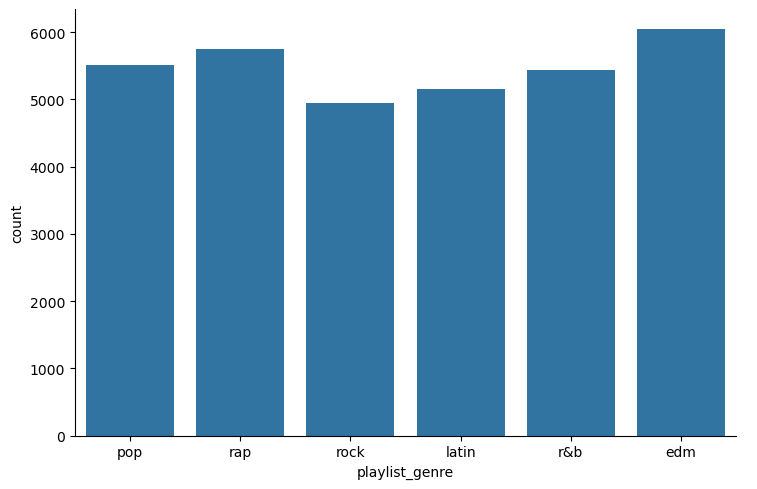

In [11]:
sns.catplot( data = spotify , kind = 'count', x = 'playlist_genre',aspect=1.5)
plt.show()

d:\Anaconda\venv\cmpin2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


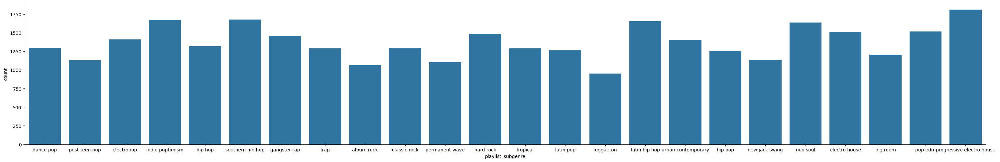

In [12]:
sns.catplot( data = spotify , kind = 'count', x = 'playlist_subgenre', aspect = 6)
plt.show()

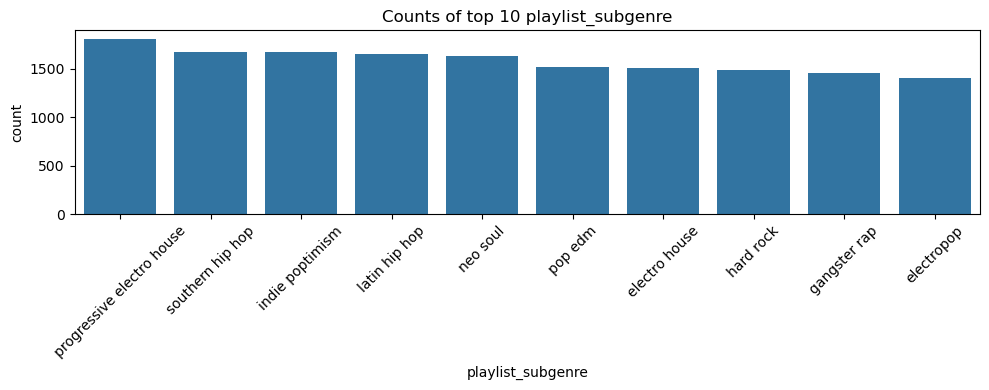

In [13]:
plt.figure(figsize=(10, 4))
sns.countplot(data=spotify, x="playlist_subgenre", order=spotify["playlist_subgenre"].value_counts().index[:10])
plt.xticks(rotation=45)
plt.title("Counts of top 10 playlist_subgenre")
plt.tight_layout()
plt.show()

2.	Distributions of continuous variables

In [14]:
spotify_lm = spotify.reset_index().rename(columns={'index':'row_id'}).melt(id_vars=categorical_vars, value_vars=continuous_vars)

d:\Anaconda\venv\cmpin2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


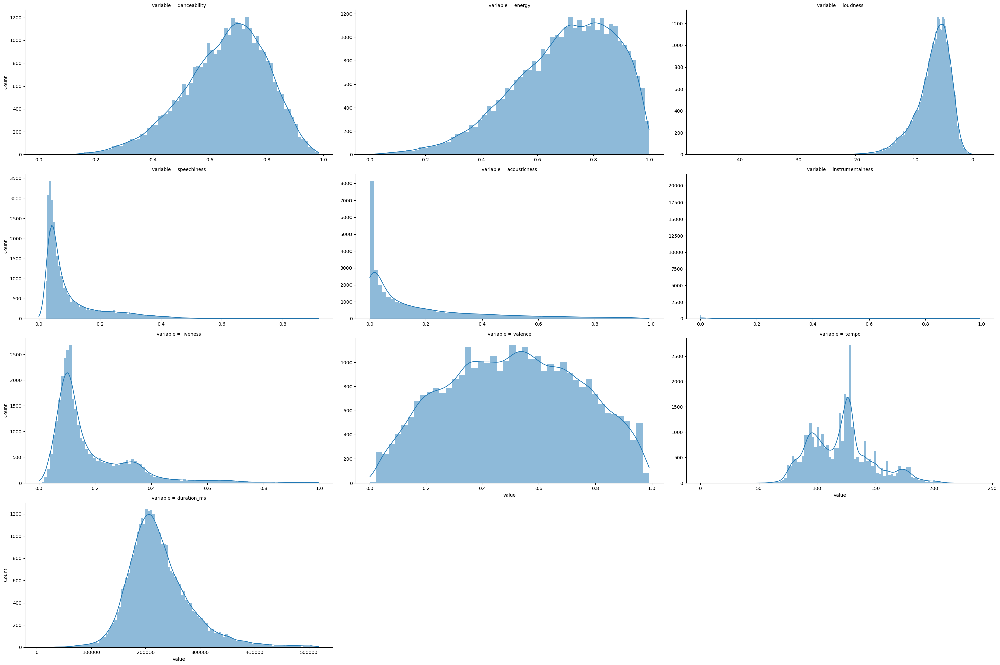

In [15]:
sns.displot( data = spotify_lm , x = 'value', col = 'variable', kind = 'hist', aspect = 2, col_wrap=3, facet_kws={'sharex': False, 'sharey': False}, common_bins=False, kde=True)
plt.show()

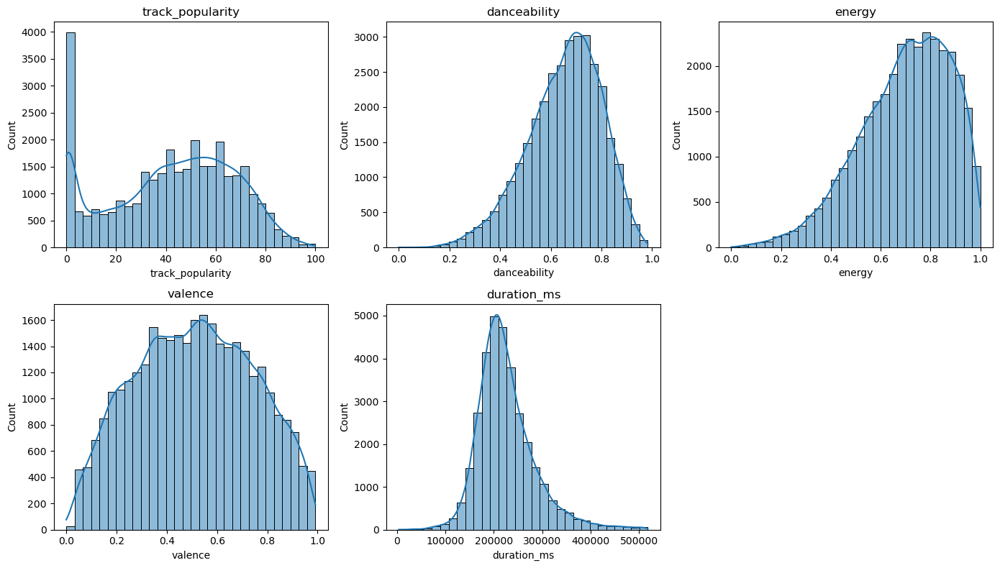

In [16]:
plt.figure(figsize=(14, 8))
for i, var in enumerate(vars_to_plot, start=1):
    plt.subplot(2, 3, i)
    sns.histplot(data=spotify, x=var, bins=30, kde=True)
    plt.title(var)
plt.tight_layout()
plt.show()

3.	Relationships between continuous variables

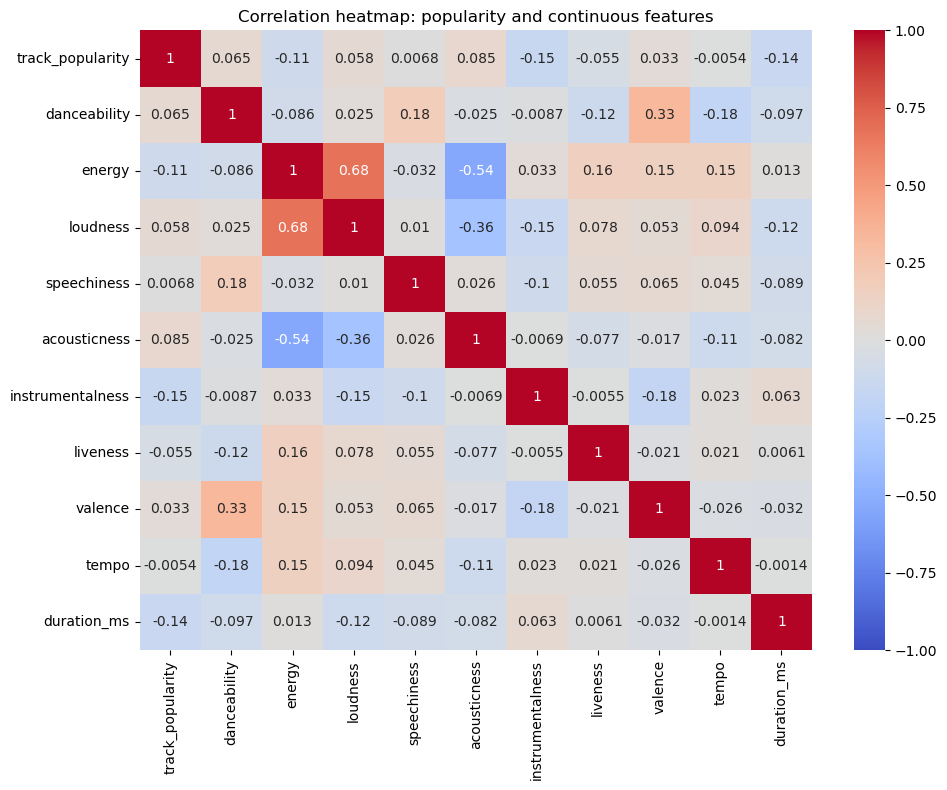

In [17]:
corr_cols = ["track_popularity"] + continuous_vars
corr = spotify[corr_cols].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr, cmap="coolwarm", center=0,annot=True,vmin=-1,vmax=1)
plt.title("Correlation heatmap: popularity and continuous features")
plt.tight_layout()
plt.show()

This corr plot summarizes the relationship between the continious variables. Track popularity is not strongly correlated with any 'one' audio characetristic. 

d:\Anaconda\venv\cmpin2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


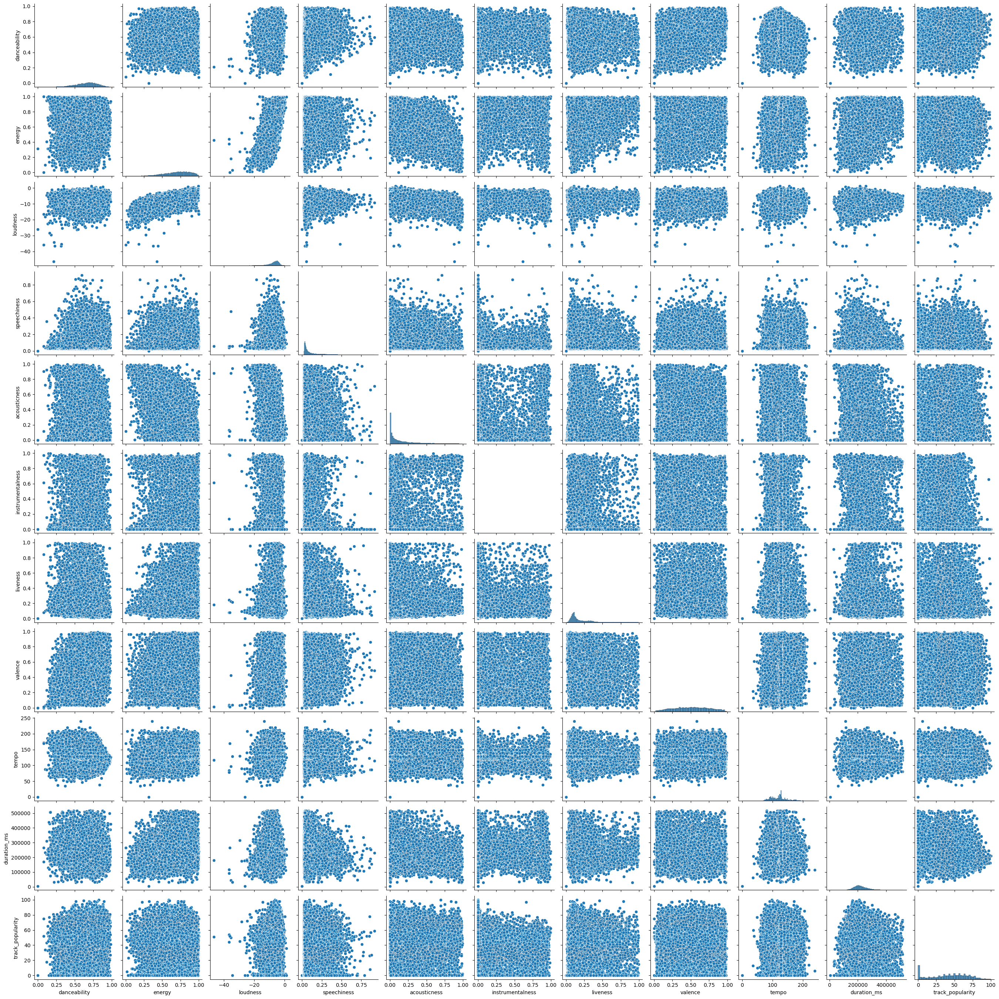

In [18]:
sns.pairplot(spotify[continuous_vars + ["track_popularity"]],diag_kws={'common_norm':False})
plt.show()

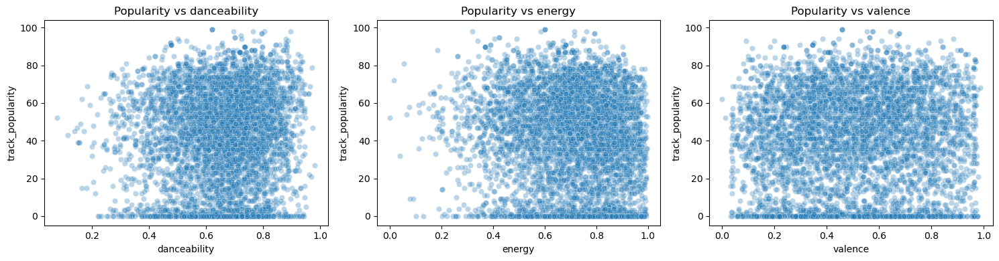

In [19]:
sample_df = spotify.sample(5000, random_state=0)

plt.figure(figsize=(15, 4))
for i, var in enumerate(["danceability", "energy", "valence"], start=1):
    plt.subplot(1, 3, i)
    sns.scatterplot(data=sample_df, x=var, y="track_popularity", alpha=0.3)
    plt.title("Popularity vs " + var)
plt.tight_layout()
plt.show()

4.	Summaries of the continuous variables grouped by categorical variables

d:\Anaconda\venv\cmpin2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


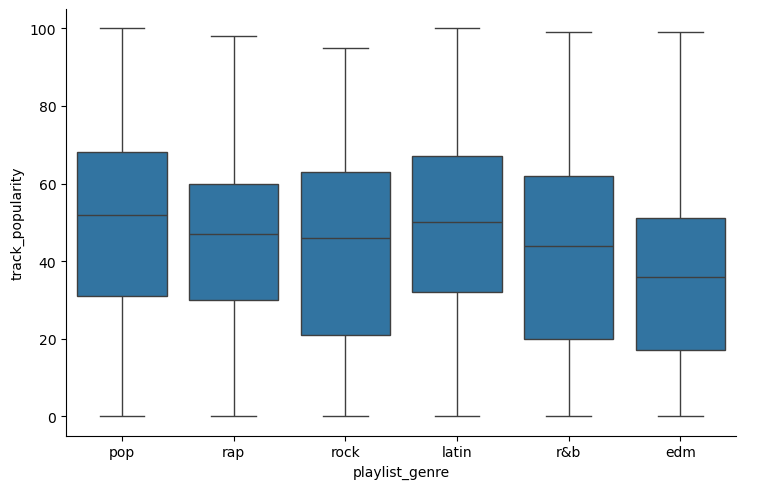

In [20]:
sns.catplot(data = spotify, x="playlist_genre", y="track_popularity", kind="box", aspect=1.5)
plt.show()

 --- 2.7 Summaries grouped by categorical variables ---

In [21]:
group_summary = (
    spotify
    .groupby("playlist_genre")[["track_popularity"] + continuous_vars]
    .mean()
    .sort_values("track_popularity", ascending=False)
)

group_summary

,track_popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
playlist_genre,,,,,,,,,,,
pop,47.744870,0.639302,0.701028,-6.315328,0.073991,0.170794,0.059876,0.176833,0.503521,120.743178,217768.104231
latin,47.026576,0.713287,0.708312,-6.264455,0.102653,0.210920,0.044447,0.180626,0.605510,118.622354,216863.446945
rap,43.215454,0.718353,0.650708,-7.042269,0.197506,0.192479,0.075997,0.191654,0.505090,120.654908,214163.889140
rock,41.728338,0.520548,0.732813,-7.588895,0.057696,0.145189,0.062417,0.203135,0.537352,124.988786,248576.500303
r&b,41.223532,0.670179,0.590934,-7.864848,0.116792,0.259904,0.028920,0.175268,0.531231,114.222156,237599.489781
edm,34.833526,0.655041,0.802476,-5.427445,0.086695,0.081504,0.218578,0.211859,0.400656,125.768024,222540.858349


In [22]:
spotify\
    .groupby(["playlist_genre"])[["track_popularity"]+continuous_vars]\
    .mean().reset_index().sort_values("track_popularity", ascending=False)

,playlist_genre,track_popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
2,pop,47.744870,0.639302,0.701028,-6.315328,0.073991,0.170794,0.059876,0.176833,0.503521,120.743178,217768.104231
1,latin,47.026576,0.713287,0.708312,-6.264455,0.102653,0.210920,0.044447,0.180626,0.605510,118.622354,216863.446945
4,rap,43.215454,0.718353,0.650708,-7.042269,0.197506,0.192479,0.075997,0.191654,0.505090,120.654908,214163.889140
5,rock,41.728338,0.520548,0.732813,-7.588895,0.057696,0.145189,0.062417,0.203135,0.537352,124.988786,248576.500303
3,r&b,41.223532,0.670179,0.590934,-7.864848,0.116792,0.259904,0.028920,0.175268,0.531231,114.222156,237599.489781
0,edm,34.833526,0.655041,0.802476,-5.427445,0.086695,0.081504,0.218578,0.211859,0.400656,125.768024,222540.858349


In [23]:
spotify\
    .groupby(["playlist_subgenre"])[["track_popularity"]+continuous_vars]\
    .mean().reset_index().sort_values("track_popularity", ascending=False)

,playlist_subgenre,track_popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
17,post-teen pop,56.825509,0.635626,0.716008,-5.540277,0.082358,0.153024,0.009367,0.180314,0.555087,123.850051,208598.733392
15,permanent wave,54.000905,0.530724,0.709683,-7.580004,0.050507,0.144509,0.087302,0.189590,0.545103,124.876413,244210.825339
9,hip pop,53.844745,0.675424,0.621870,-6.871198,0.122393,0.255173,0.031629,0.172780,0.514428,116.026076,211897.167994
8,hip hop,53.773071,0.719628,0.565940,-8.243336,0.189124,0.308059,0.218851,0.173616,0.509257,118.260575,181696.042360
19,reggaeton,52.869336,0.760954,0.746515,-5.336615,0.123065,0.201285,0.003761,0.182066,0.678986,119.256106,218115.869336
3,dance pop,52.079353,0.655752,0.742189,-5.768586,0.075837,0.144161,0.048890,0.176795,0.505211,120.106639,207832.938367
12,latin pop,51.099842,0.686111,0.689050,-6.186886,0.090443,0.247439,0.014786,0.188604,0.607369,119.638224,216682.389065
23,urban contemporary,50.523843,0.651922,0.572769,-7.625293,0.130267,0.298932,0.023077,0.172841,0.470657,118.260871,228450.264057
21,trap,50.308288,0.715405,0.655576,-6.528663,0.144863,0.216218,0.067978,0.166972,0.437307,130.034411,200910.660728
16,pop edm,45.686223,0.647744,0.742543,-5.453845,0.085093,0.136459,0.047935,0.196825,0.464772,123.169141,205710.918260


Teen pop is the most popular subgenre playlist. 

In [24]:
spotify\
    .groupby(["playlist_subgenre"])["track_popularity"]\
    .mean().reset_index().sort_values("track_popularity", ascending=False)

,playlist_subgenre,track_popularity
17,post-teen pop,56.825509
15,permanent wave,54.000905
9,hip pop,53.844745
8,hip hop,53.773071
19,reggaeton,52.869336
3,dance pop,52.079353
12,latin pop,51.099842
23,urban contemporary,50.523843
21,trap,50.308288
16,pop edm,45.686223


### Duplicated data

In this section, only the code will be done to remove duplicated rows from the dataset. This will ensure that the analysis and results are more reliable.

In [25]:
spotify = spotify.loc[~spotify.track_id.duplicated(), :]

## Clustering: Revisited 


In this iteration of the clustering exercise, we will apply hierarchial clustering.

In [26]:
cluster_vars = [
    "danceability", "energy", "loudness", "speechiness",
    "acousticness", "instrumentalness", "liveness", "valence",
    "tempo", "duration_ms"
]

In [27]:
spotify_cluster = spotify.dropna(subset=cluster_vars + ["track_popularity"]).copy()

In [28]:
X_cluster = spotify_cluster[cluster_vars].values

In [29]:
X_scaled = StandardScaler().fit_transform(X_cluster)

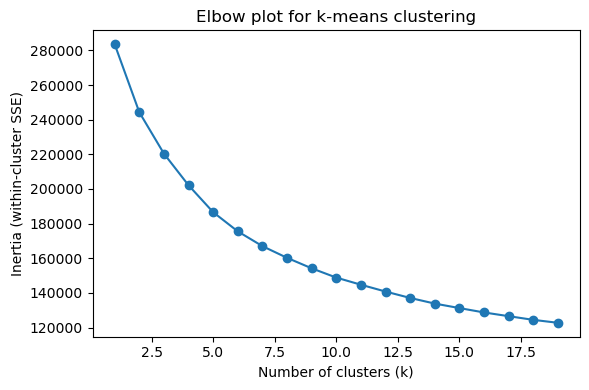

In [ ]:
tots = []
ks = list(range(1,20))
for k in ks:
    km = KMeans(n_clusters=k, n_init=10, random_state=0)
    km.fit(X_scaled)
    tots.append(km.inertia_)

plt.figure(figsize=(6, 4))
plt.plot(ks, tots, marker="o")
plt.xlabel("Number of clusters (k)")
plt.ylabel("Inertia (within-cluster SSE)")
plt.title("Elbow plot for k-means clustering")
plt.tight_layout()
plt.show()

We will try hierarchial clustering.

In [31]:
from scipy.cluster import hierarchy

In [35]:
hclust_ward = hierarchy.ward(X_scaled)

MemoryError: Unable to allocate 3.00 GiB for an array with shape (402017190,) and data type float64

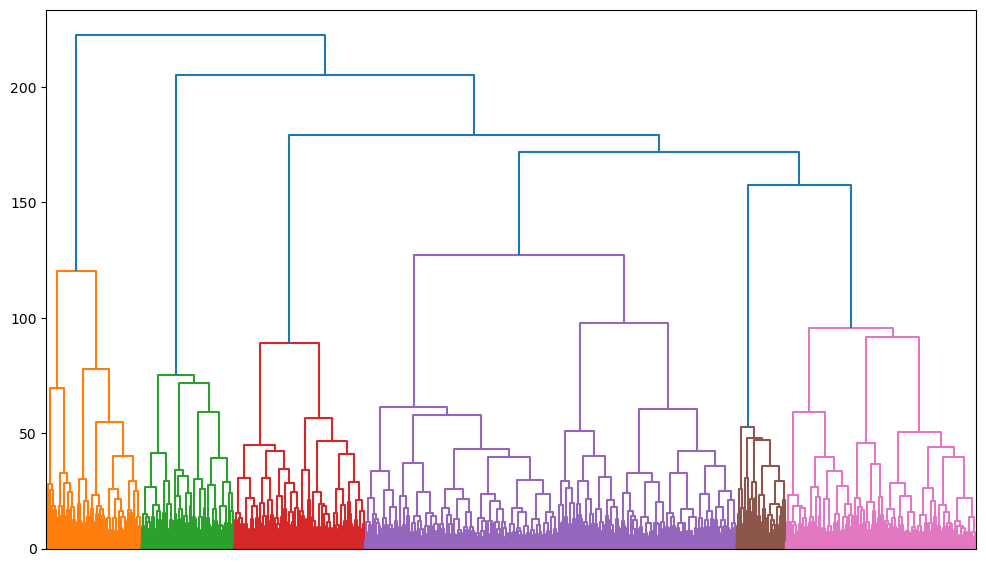

In [ ]:
fig = plt.figure(figsize=(12, 7))
dn = hierarchy.dendrogram(hclust_ward, no_labels=True)
plt.show()

It seems that we have 6 distinct clusters.

In [ ]:
spotify['k'] = pd.Series(hierarchy.cut_tree(hclust_ward, n_clusters=4).ravel(),index = spotify.index).astype('category')

d:\Anaconda\venv\cmpin2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


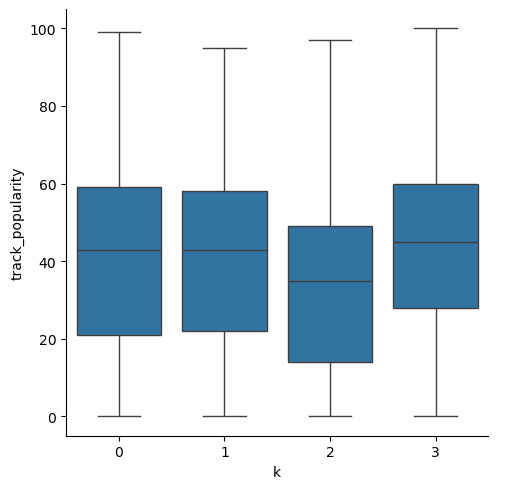

In [ ]:
sns.catplot(data = spotify , x="k", y="track_popularity", kind="box", aspect=1)
plt.show()

In [ ]:
spotify.groupby('k')[continuous_vars + ['track_popularity']].mean()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,track_popularity
k,,,,,,,,,,,
0,0.652164,0.736680,-6.260000,0.076657,0.123858,0.021978,0.207172,0.542251,121.422971,226445.501476,39.903129
1,0.709523,0.675679,-6.743498,0.294719,0.154332,0.006747,0.175967,0.529467,121.869349,219106.025151,39.818913
2,0.657353,0.718471,-7.829748,0.077385,0.162057,0.712202,0.159662,0.400815,122.983098,231470.241071,31.884615
3,0.578474,0.457930,-9.547663,0.083113,0.575174,0.025900,0.137563,0.386748,114.525539,232882.608113,42.522751


d:\Anaconda\venv\cmpin2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


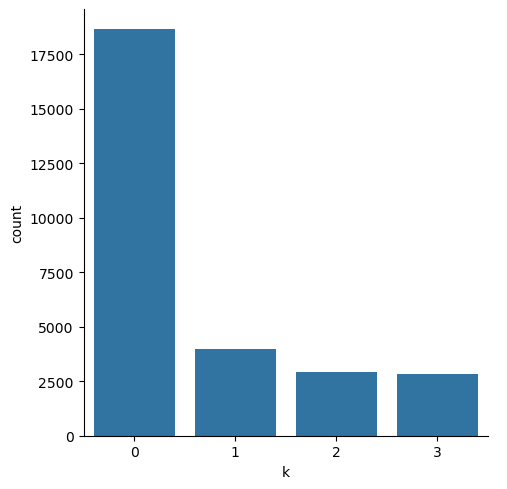

In [ ]:
sns.catplot(data = spotify , x= 'k' , kind = 'count', aspect=1)
plt.show()

d:\Anaconda\venv\cmpin2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


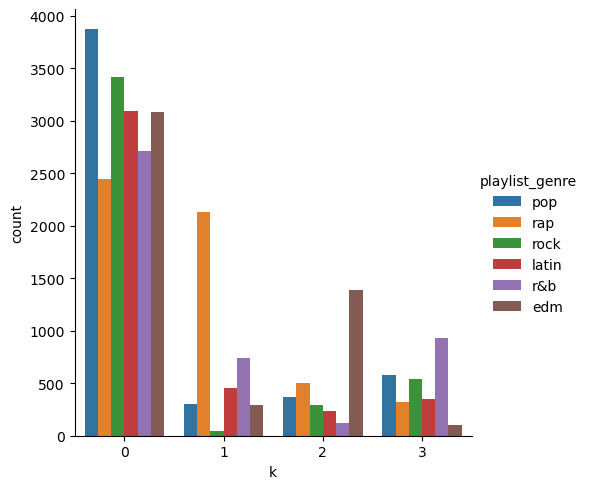

In [ ]:
sns.catplot(data = spotify , x= 'k' , kind = 'count', aspect=1, hue='playlist_genre')
plt.show()

d:\Anaconda\venv\cmpin2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


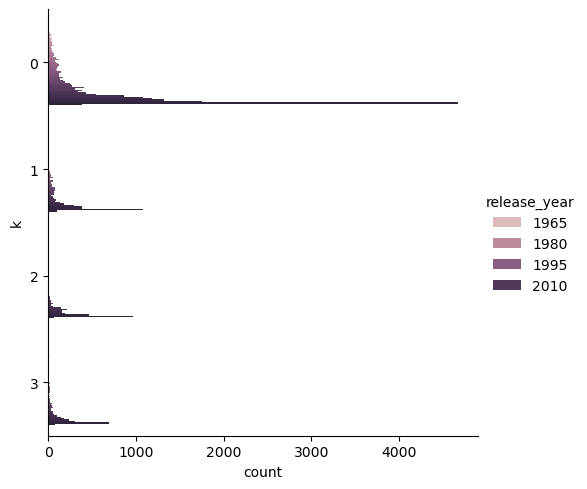

In [ ]:
sns.catplot(data = spotify , y= 'k' , kind = 'count', aspect=1, hue='release_year')
plt.show()

In [ ]:
spotify.groupby('k')[continuous_vars + ['track_popularity','playlist_genre']].count()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,track_popularity,playlist_genre
k,,,,,,,,,,,,
0,18633,18633,18633,18633,18633,18633,18633,18633,18633,18633,18633,18633
1,3976,3976,3976,3976,3976,3976,3976,3976,3976,3976,3976,3976
2,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912,2912
3,2835,2835,2835,2835,2835,2835,2835,2835,2835,2835,2835,2835


In [ ]:
pd.crosstab(spotify['k'], spotify['playlist_genre'])

playlist_genre,edm,latin,pop,r&b,rap,rock
k,,,,,,
0,3087,3090,3873,2714,2446,3423
1,295,459,305,738,2130,49
2,1393,234,371,122,500,292
3,102,354,583,930,325,541


In [ ]:
spotify.groupby('k')[continuous_vars + ['track_popularity']].mean()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,track_popularity
k,,,,,,,,,,,
0,0.652164,0.736680,-6.260000,0.076657,0.123858,0.021978,0.207172,0.542251,121.422971,226445.501476,39.903129
1,0.709523,0.675679,-6.743498,0.294719,0.154332,0.006747,0.175967,0.529467,121.869349,219106.025151,39.818913
2,0.657353,0.718471,-7.829748,0.077385,0.162057,0.712202,0.159662,0.400815,122.983098,231470.241071,31.884615
3,0.578474,0.457930,-9.547663,0.083113,0.575174,0.025900,0.137563,0.386748,114.525539,232882.608113,42.522751


## Modeling


There are some variables that we want to create specifically for modelling. 

In [ ]:
def my_coefplot(mod, figsize_use=(10, 4)):
    fig, ax = plt.subplots(figsize=figsize_use)
    
    ax.errorbar( y=mod.params.index,
                 x=mod.params,
                 xerr = 2 * mod.bse,
                 fmt='o', color='k', ecolor='k', elinewidth=2, ms=10)
    
    ax.axvline(x=0, linestyle='--', linewidth=3.5, color='grey')
    
    ax.set_xlabel('coefficient value')
    
    plt.show()

In [ ]:
spotify.info()

<class 'pandas.core.frame.DataFrame'>
Index: 28356 entries, 0 to 32832
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   track_id                  28356 non-null  object        
 1   track_name                28352 non-null  object        
 2   track_artist              28352 non-null  object        
 3   track_popularity          28356 non-null  int64         
 4   track_album_id            28356 non-null  object        
 5   track_album_name          28352 non-null  object        
 6   track_album_release_date  26675 non-null  datetime64[ns]
 7   playlist_name             28356 non-null  object        
 8   playlist_id               28356 non-null  object        
 9   playlist_genre            28356 non-null  object        
 10  playlist_subgenre         28356 non-null  object        
 11  danceability              28356 non-null  float64       
 12  energy                 

In [ ]:
spotify_model = spotify.copy()

In [ ]:
artist_vars = spotify.groupby(['track_artist']).agg(
    artist_avg_popularity=('track_popularity','mean'),
    artist_n_tracks=('track_popularity','count'),
    artist_n_genres=('playlist_genre','nunique'),
    artist_n_playlists=('playlist_id','nunique'),
    artist_n_subgenres=('playlist_subgenre','nunique'),
    artist_hit_rate=('track_popularity', lambda x: np.where(x > 70,1,0).mean()),
    artist_energy_mean=('energy','mean'),
    artist_danceability_mean=('danceability','mean'),
    artist_valence_mean=('valence','mean'),
    artist_tempo_mean=('tempo','mean'),
    artist_acousticness_mean=('acousticness','mean'),
    artist_speechiness_mean=('speechiness','mean'),
    artist_instrumentalness_mean=('instrumentalness','mean'),
    artist_liveness_mean=('liveness','mean')
).reset_index().sort_values(by='artist_n_playlists', ascending=False)

In [ ]:
playlist_vars = spotify.groupby(['playlist_id']).agg(
    playlist_avg_popularity=('track_popularity','mean'),
    playlist_n_tracks=('track_popularity','count'),
    playlist_n_genres=('playlist_genre','nunique'),
    playlist_n_subgenres=('playlist_subgenre','nunique')
).reset_index().sort_values(by='playlist_n_tracks', ascending=False)

In [ ]:
spotify_model = spotify_model.merge(artist_vars, on='track_artist', how='inner')
spotify_model = spotify_model.merge(playlist_vars, on='playlist_id', how='inner')

In [ ]:
def fit_ols(formula, data):
    model = smf.ols(formula=formula, data=data).fit()
    print(model.summary())
    return model

In [ ]:
def viz_fitted_vs_actual(fitted, actual, title):
    df_viz = pd.DataFrame({
        'Fitted Values': fitted,
        'Actual Values': actual
    })
    plt.figure(figsize=(6,6))
    sns.scatterplot(data=df_viz, x='Actual Values', y='Fitted Values', alpha=0.3)
    sns.lineplot(data=df_viz, x='Actual Values', y='Actual Values', color='red')
    plt.title(title)
    plt.show()

Are the variables Gaussian ? 

In [ ]:
spotify_lm = spotify_model.reset_index().rename(columns={'index':'row_id'}).melt(id_vars=categorical_vars, value_vars=continuous_vars+artist_vars.columns.tolist()[1:])

d:\Anaconda\venv\cmpin2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


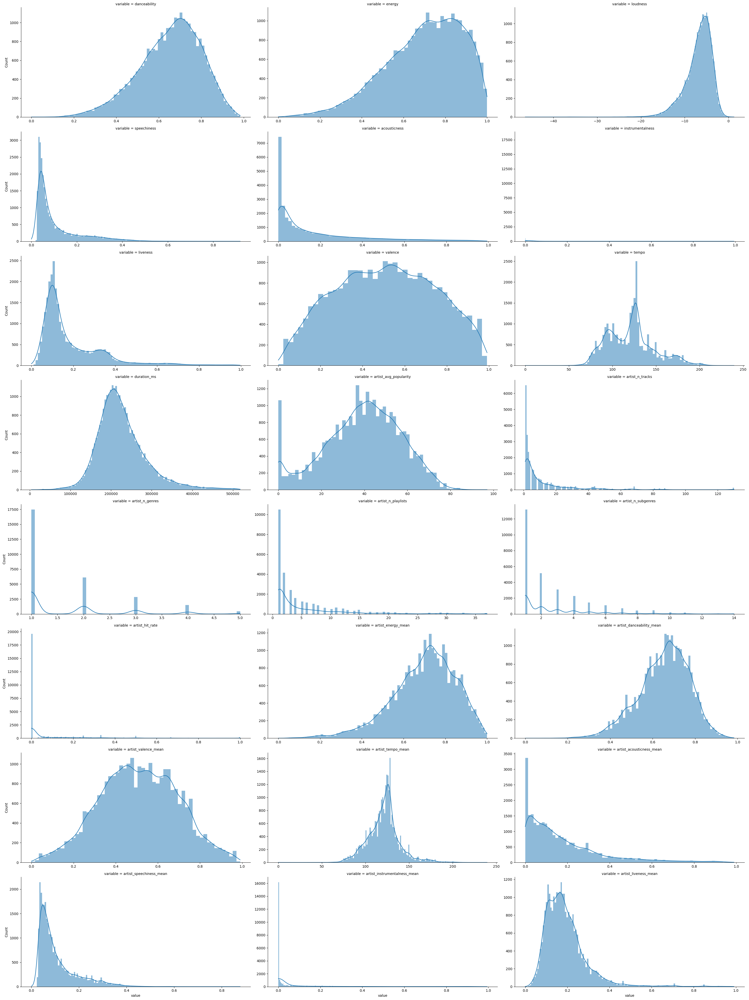

In [ ]:
sns.displot( data = spotify_lm , x = 'value', col = 'variable', kind = 'hist', aspect = 2, col_wrap=3, facet_kws={'sharex': False, 'sharey': False}, common_bins=False, kde=True)
plt.show()

As is shown by the graph above, the new variable avg_artist_popularity, seems to follow gaussian distribution. The remainin artist related variables will remain as categorical variables. Hence, it is not necessary that are Gaussian like.

However, we will drop artist_n_playlist becasue this kind of information will be already captured essentially in artist_n_genres. Plus, it is easier to work with artist_n_genres since there are only 5 unique values. For the same reason, we will also drop artist_n_subgenre.

We will go ahead and start fitting models.


But first we will first apply natural to some variables and then standardize the values of continious variables.

In [ ]:
spotify_model.isna().sum().sort_values(ascending=False)

release_year                    1681
release_month                   1681
track_album_release_date        1681
track_id                           0
artist_n_subgenres                 0
k                                  0
artist_avg_popularity              0
artist_n_tracks                    0
artist_n_genres                    0
artist_n_playlists                 0
artist_hit_rate                    0
tempo                              0
artist_energy_mean                 0
artist_danceability_mean           0
artist_valence_mean                0
artist_tempo_mean                  0
artist_acousticness_mean           0
artist_speechiness_mean            0
artist_instrumentalness_mean       0
duration_ms                        0
valence                            0
track_name                         0
playlist_subgenre                  0
track_artist                       0
track_popularity                   0
track_album_id                     0
track_album_name                   0
p

In [ ]:
cat_var = ['playlist_subgenre', 'mode','artist_n_genres']

In [ ]:
cont_var = ['danceability', 'energy','speechiness',
    'acousticness', 'instrumentalness', 'liveness', 'valence',
    'tempo', 'duration_ms', 'artist_avg_popularity',
 'artist_n_tracks',
 'artist_hit_rate',
 'artist_energy_mean',
 'artist_danceability_mean',
 'artist_valence_mean',
 'artist_tempo_mean',
 'artist_acousticness_mean',
 'artist_speechiness_mean',
 'artist_instrumentalness_mean',
 'artist_liveness_mean','playlist_avg_popularity']

In [ ]:
cont_features = (
    "danceability + energy  + speechiness + acousticness + instrumentalness + liveness + valence + \
    tempo + duration_ms + artist_avg_popularity + artist_hit_rate + \
    artist_n_tracks + artist_energy_mean + artist_danceability_mean + artist_valence_mean + artist_tempo_mean + \
    artist_acousticness_mean + artist_speechiness_mean + artist_instrumentalness_mean + artist_liveness_mean+ playlist_avg_popularity"
)

In [ ]:
cat_features = "playlist_subgenre + mode  + artist_n_genres + key"

'Artist_n_tracks' has more than needed unique values. Therefore, we will group values together to make the modelling work easier to interpret as a categorical variable.

In [ ]:
#spotify_model['artist_n_tracks'] = pd.to_numeric(spotify_copy['artist_n_tracks'])
#spotify_model['artist_n_tracks'] = np.where(spotify_copy['artist_n_tracks']<20,'Low',
#                                            np.where(spotify_copy['artist_n_tracks']<40,'Medium','High'))

Natural log of all continious variables.

In [ ]:
spotify_model[cont_var] = np.log1p(spotify_model[cont_var])

Now we visualize all continious variables to ensure Gaussian like behaviour.

In [ ]:
spotify_lm = spotify_model.reset_index().rename(columns={'index':'row_id'}).melt(id_vars=cat_var, value_vars=cont_var)

d:\Anaconda\venv\cmpin2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


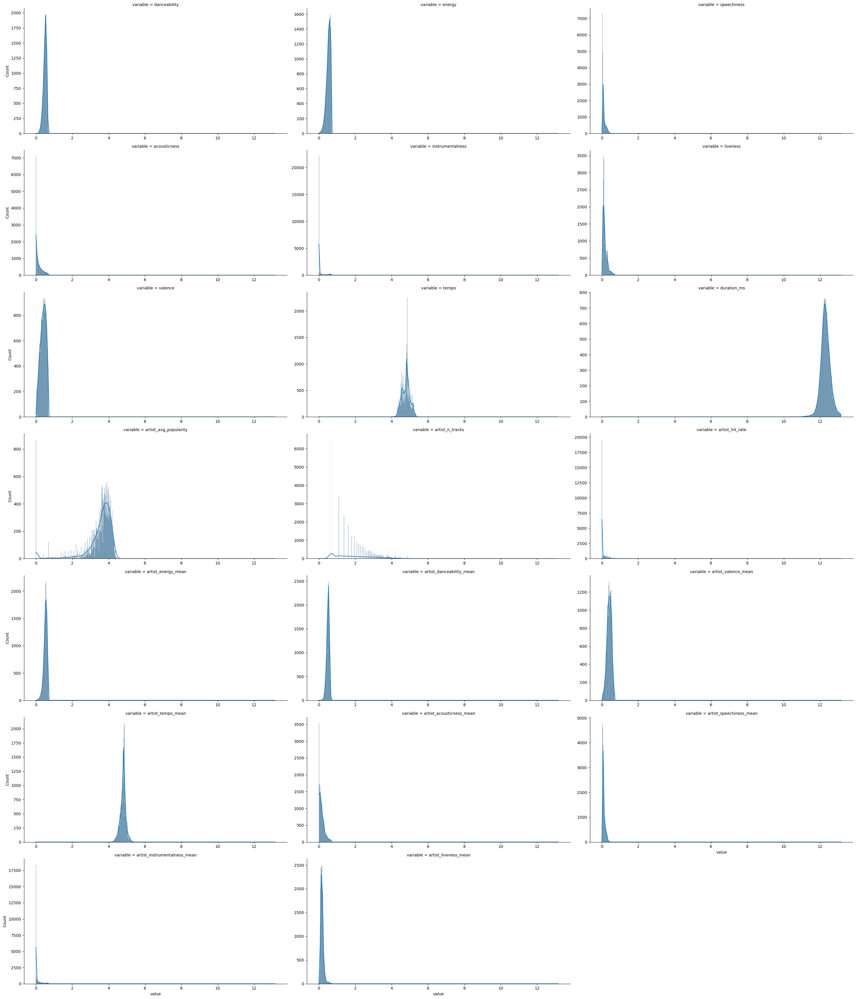

In [ ]:
sns.displot( data = spotify_lm , x = 'value', col = 'variable', kind = 'hist', aspect = 2, col_wrap=3, facet_kws={'sharex': False, 'sharey': False},kde=True)
plt.show()

In [ ]:
spotify_model[cat_var] = spotify_model[cat_var].astype('category')

Standardization

In [ ]:
x_scaled = pd.DataFrame(StandardScaler().fit_transform(spotify_model[cont_var]), columns=cont_var)

In [ ]:
# Fix the typo
spotify_model[cont_var] = pd.DataFrame(
    StandardScaler().fit_transform(spotify_model[cont_var]), 
    columns=cont_var,
    index=spotify_model.index  # Add this line to preserve the index
)

Intercept-only model

In [ ]:
f_1 = "track_popularity ~ 1"

In [ ]:
m_1 = fit_ols(f_1, spotify_model)

                            OLS Regression Results                            
Dep. Variable:       track_popularity   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Tue, 09 Dec 2025   Prob (F-statistic):                nan
Time:                        17:26:10   Log-Likelihood:            -1.2998e+05
No. Observations:               28352   AIC:                         2.600e+05
Df Residuals:                   28351   BIC:                         2.600e+05
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     39.3353      0.141    279.471      0.0

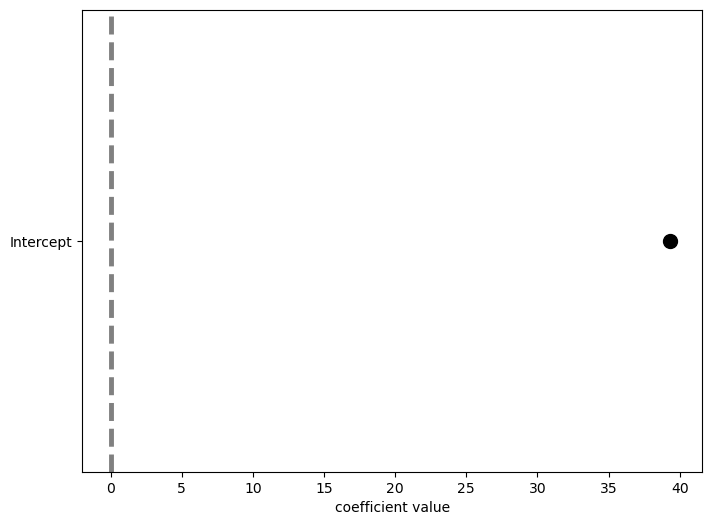

In [ ]:
my_coefplot(m_1, figsize_use=(8,6))

How many coefficients were estimated?

In [ ]:
m_1.params.size

1

How many coefficients (and thus features) are STATISTICALLY SIGNIFICANT using commonly accepted thresholds?

In [ ]:
m_1.params[m_1.pvalues < 0.05].size

1

WHICH coefficients (and thus features) are STATISTICALLY SIGNIFICANT and what are the coefficients POSITIVE or NEGATIVE for those features?

In [ ]:
m_1.params[m_1.pvalues < 0.05]

Intercept    39.33532
dtype: float64

Which two STATISTICALLY SIGNIFICANT coefficients (and thus features) have the highest MAGNITUDE coefficient values

In [ ]:
m1.params[m1.pvalues < 0.05].sort_values(key=abs,ascending=False)

Intercept    39.33532
dtype: float64

Training Performance

In [ ]:
print(f'R squared: {m1.rsquared}, RMSE: {m1.mse_resid**0.5}')

R squared: 0.0, RMSE: 23.69944331918895


Observed vs Predicted figure

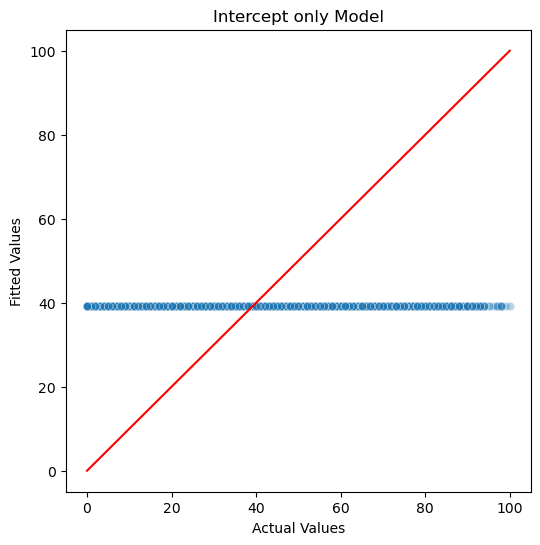

In [ ]:
viz_fitted_vs_actual(m1.fittedvalues, spotify_model['track_popularity'], 'Intercept only Model')

Categorical inputs with additive features

In [ ]:
f_2 = "track_popularity ~ +" + cat_features

In [ ]:
m_2 = fit_ols(f_2, spotify_model)

                            OLS Regression Results                            
Dep. Variable:       track_popularity   R-squared:                       0.158
Model:                            OLS   Adj. R-squared:                  0.158
Method:                 Least Squares   F-statistic:                     183.9
Date:                Tue, 09 Dec 2025   Prob (F-statistic):               0.00
Time:                        17:26:14   Log-Likelihood:            -1.2753e+05
No. Observations:               28352   AIC:                         2.551e+05
Df Residuals:                   28322   BIC:                         2.554e+05
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

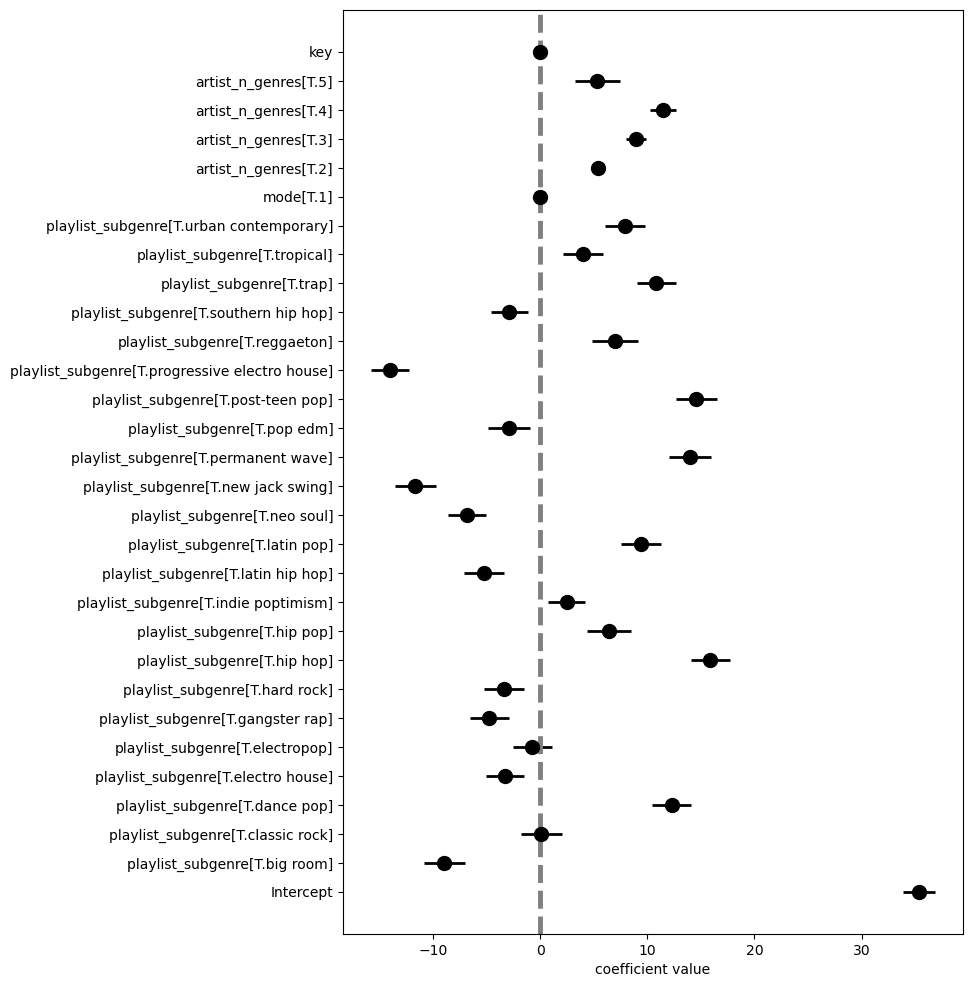

In [ ]:
my_coefplot(m_2, figsize_use=(8,12))

How many coefficients were estimated?

In [ ]:
m_2.params.size

30

How many coefficients (and thus features) are STATISTICALLY SIGNIFICANT using commonly accepted thresholds?

In [ ]:
print(m_2.params[m_2.pvalues < 0.05].size)

26


WHICH coefficients (and thus features) are STATISTICALLY SIGNIFICANT and what are the coefficients POSITIVE or NEGATIVE for those features?

In [ ]:
m_2.params[m_2.pvalues < 0.05]

Intercept                                         35.350127
playlist_subgenre[T.big room]                     -8.938483
playlist_subgenre[T.dance pop]                    12.269645
playlist_subgenre[T.electro house]                -3.279704
playlist_subgenre[T.gangster rap]                 -4.741553
playlist_subgenre[T.hard rock]                    -3.355361
playlist_subgenre[T.hip hop]                      15.871143
playlist_subgenre[T.hip pop]                       6.445567
playlist_subgenre[T.indie poptimism]               2.482334
playlist_subgenre[T.latin hip hop]                -5.222045
playlist_subgenre[T.latin pop]                     9.441476
playlist_subgenre[T.neo soul]                     -6.787420
playlist_subgenre[T.new jack swing]              -11.664472
playlist_subgenre[T.permanent wave]               13.989716
playlist_subgenre[T.pop edm]                      -2.942566
playlist_subgenre[T.post-teen pop]                14.563470
playlist_subgenre[T.progressive electro 

Which two STATISTICALLY SIGNIFICANT coefficients (and thus features) have the highest MAGNITUDE coefficient values?

In [ ]:
print(m_2.params[m_2.pvalues < 0.05].sort_values(key=abs,ascending=False)[1:3])

playlist_subgenre[T.hip hop]          15.871143
playlist_subgenre[T.post-teen pop]    14.563470
dtype: float64


Show the predicted vs observed figure for the training set, and the R-squared and RMSE on the training set.

In [ ]:
def viz_fitted_vs_actual(fitted, actual, title):
    df_viz = pd.DataFrame({
        'Fitted Values': fitted,
        'Actual Values': actual
    })
    plt.figure(figsize=(6,6))
    sns.scatterplot(data=df_viz, x='Actual Values', y='Fitted Values', alpha=0.3)
    sns.lineplot(data=df_viz, x='Actual Values', y='Actual Values', color='red')
    plt.title(title)
    plt.show()

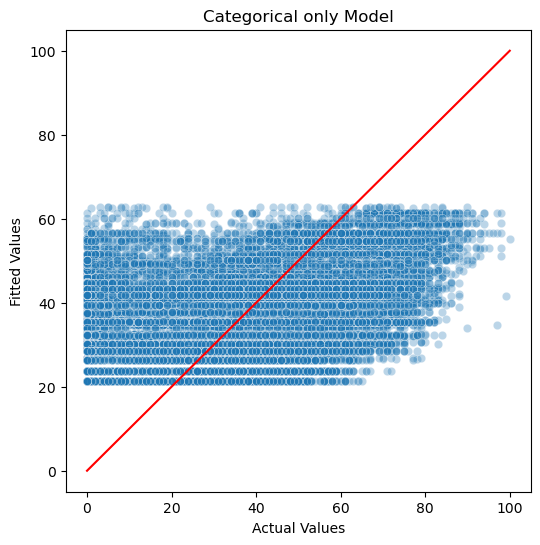

In [ ]:
viz_fitted_vs_actual(m_2.fittedvalues, spotify_model['track_popularity'],'Categorical only Model')

Training performance

In [ ]:
print(f'R squared: {m_cat.rsquared}, RMSE: {m_cat.mse_resid**0.5}')

R squared: 0.15849282400371167, RMSE: 21.75150385497045


Categorical only model barely does better than the intercept only model as indicated by RMSE of 21 vs 23. 

### Continuous inputs with linear additive features

In [ ]:
f_3 = "track_popularity ~ " + cont_features

In [ ]:
m_3 = fit_ols(f_3, spotify_model)

                            OLS Regression Results                            
Dep. Variable:       track_popularity   R-squared:                       0.528
Model:                            OLS   Adj. R-squared:                  0.527
Method:                 Least Squares   F-statistic:                     1507.
Date:                Wed, 10 Dec 2025   Prob (F-statistic):               0.00
Time:                        03:46:45   Log-Likelihood:            -1.1934e+05
No. Observations:               28352   AIC:                         2.387e+05
Df Residuals:                   28330   BIC:                         2.389e+05
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

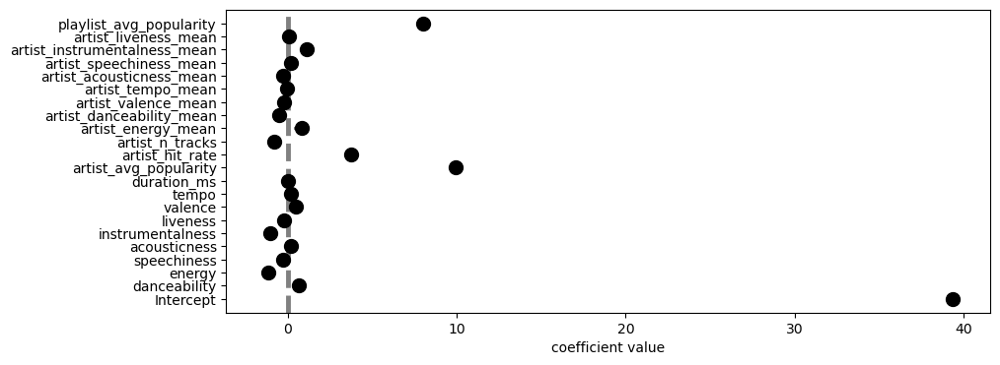

In [ ]:
my_coefplot(m_3)

i.	How many coefficients were estimated?

10 Coefficients were estimated. 


ii.	How many coefficients (and thus features) are STATISTICALLY SIGNIFICANT using commonly accepted thresholds?
Nearly all coefficients are statsitically significant except for mode. 

iii.	WHICH coefficients (and thus features) are STATISTICALLY SIGNIFICANT and what are the coefficients POSITIVE or NEGATIVE for those features?
iv.	Which two STATISTICALLY SIGNIFICANT coefficients (and thus features) have the highest MAGNITUDE coefficient values?

How many coefficients were estimated?

In [ ]:
m_3.params.size

22

How many coefficients (and thus features) are STATISTICALLY SIGNIFICANT using commonly accepted thresholds?

In [ ]:
m_3.params[m_3.pvalues < 0.05].size

12

WHICH coefficients (and thus features) are STATISTICALLY SIGNIFICANT and what are the coefficients POSITIVE or NEGATIVE for those features?

In [ ]:
m_3.params[m_3.pvalues < 0.05]

Intercept                       39.335320
danceability                     0.681033
energy                          -1.172547
instrumentalness                -1.028642
valence                          0.499804
artist_avg_popularity            9.920143
artist_hit_rate                  3.751601
artist_n_tracks                 -0.819824
artist_energy_mean               0.815204
artist_danceability_mean        -0.501500
artist_instrumentalness_mean     1.150451
playlist_avg_popularity          8.003964
dtype: float64

Which two STATISTICALLY SIGNIFICANT coefficients (and thus features) have the highest MAGNITUDE coefficient values?

In [ ]:
m_3.params[m_3.pvalues < 0.05].sort_values(key=abs,ascending=False)[1:3]

artist_avg_popularity    13.358650
artist_hit_rate           5.209513
dtype: float64

For each model show the predicted vs observed figure for the training set, and the R-squared and RMSE on the training set.

In [ ]:
print(f'R squared: {m_3.rsquared}, RMSE: {m_3.mse_resid**0.5}')

R squared: 0.5276510268815217, RMSE: 16.294105968324935


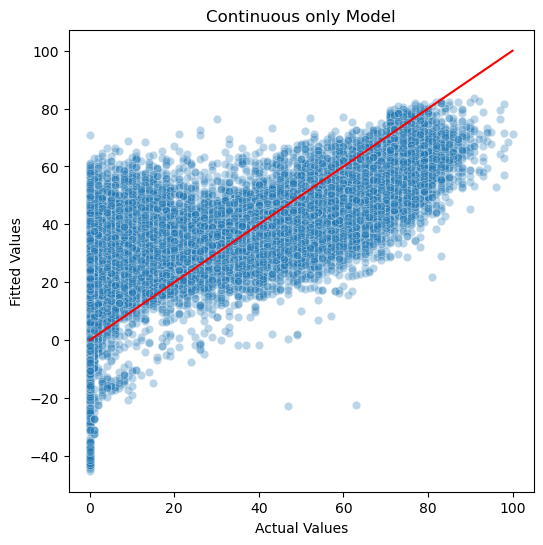

In [ ]:
viz_fitted_vs_actual(m_3.fittedvalues, spotify_model['track_popularity'], 'Continuous only Model')

### All inputs (continuous + categorical) additive

In [ ]:
f_4 = (
    "track_popularity ~ " + cont_features + " + " + cat_features
)

In [ ]:
m_4 = fit_ols(f_4, spotify_model)

                            OLS Regression Results                            
Dep. Variable:       track_popularity   R-squared:                       0.533
Model:                            OLS   Adj. R-squared:                  0.533
Method:                 Least Squares   F-statistic:                     688.5
Date:                Wed, 10 Dec 2025   Prob (F-statistic):               0.00
Time:                        03:49:48   Log-Likelihood:            -1.1917e+05
No. Observations:               28352   AIC:                         2.384e+05
Df Residuals:                   28304   BIC:                         2.388e+05
Df Model:                          47                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

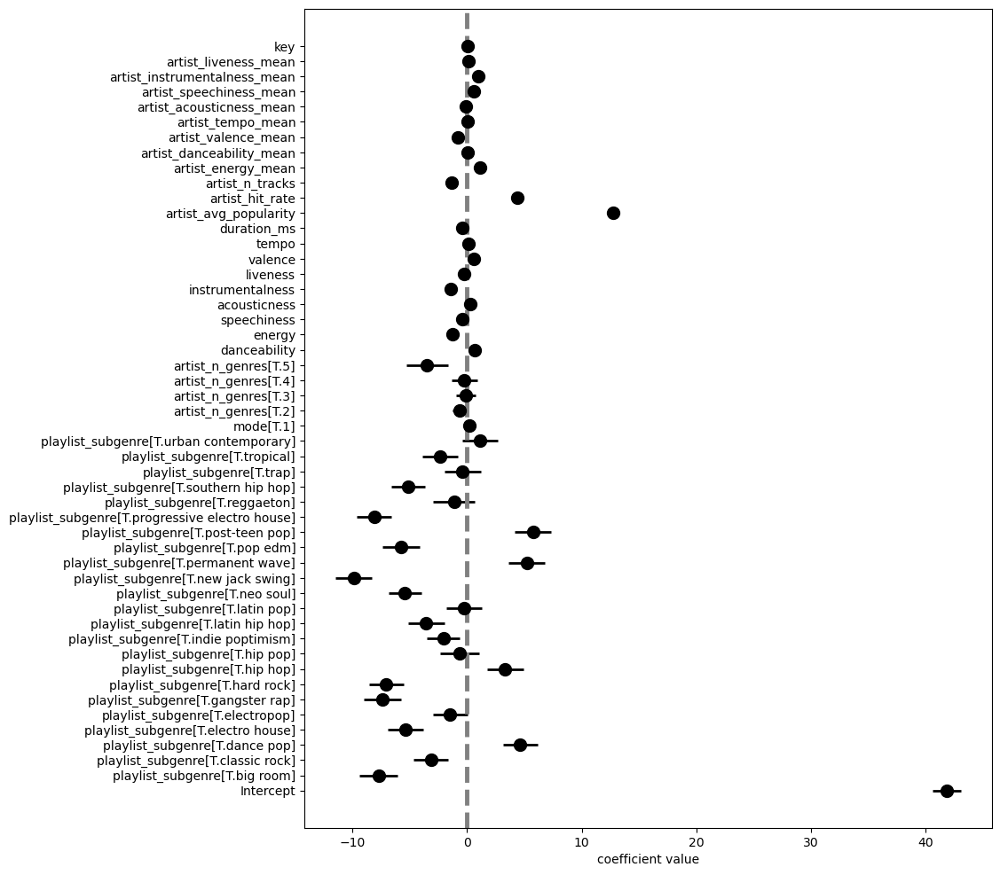

In [ ]:
my_coefplot(m_all, figsize_use=(10,12))

How many coefficients were estimated?

In [ ]:
m_4.params.size

48

How many coefficients (and thus features) are STATISTICALLY SIGNIFICANT using commonly accepted thresholds?

In [ ]:
m_4.params[m_4.pvalues < 0.05].size

27

WHICH coefficients (and thus features) are STATISTICALLY SIGNIFICANT and what are the coefficients POSITIVE or NEGATIVE for those features?

In [ ]:
m_4.params[m_4.pvalues < 0.05]

Intercept                                42.186147
playlist_subgenre[T.big room]            -3.029620
playlist_subgenre[T.classic rock]        -2.983779
playlist_subgenre[T.dance pop]            1.743533
playlist_subgenre[T.electro house]       -2.461842
playlist_subgenre[T.gangster rap]        -4.355652
playlist_subgenre[T.hard rock]           -4.150836
playlist_subgenre[T.indie poptimism]     -1.422858
playlist_subgenre[T.latin pop]           -1.501753
playlist_subgenre[T.new jack swing]      -4.719727
playlist_subgenre[T.pop edm]             -3.365604
playlist_subgenre[T.post-teen pop]        2.595075
playlist_subgenre[T.reggaeton]           -2.104822
playlist_subgenre[T.southern hip hop]    -3.622466
playlist_subgenre[T.trap]                -1.837599
playlist_subgenre[T.tropical]            -2.348388
danceability                              0.697492
energy                                   -1.095441
instrumentalness                         -0.982516
valence                        

Which two STATISTICALLY SIGNIFICANT coefficients (and thus features) have the highest MAGNITUDE coefficient values?

In [ ]:
m_4.params[m_4.pvalues < 0.05].sort_values(key=abs,ascending=False)[1:3]

artist_avg_popularity      10.095314
playlist_avg_popularity     7.588078
dtype: float64

Training Performance

In [ ]:
print(f'R squared: {m_4.rsquared}, RMSE: {m_4.mse_resid**0.5}')

R squared: 0.5334176551680413, RMSE: 16.20177433293829


The performance is certianly better than average as shown by the higher r squared and lower rmse. However, it is only bit better than continuous terms only.

### Continuous inputs with linear main effect and pair-wise interactions.

In [ ]:
f_5 =  "track_popularity ~ (danceability + energy  + speechiness + acousticness + instrumentalness + liveness + valence + tempo + duration_ms \
    + artist_avg_popularity + artist_hit_rate + artist_n_tracks + playlist_avg_popularity )**2"

In [ ]:
m_5 = fit_ols(f_5, spotify_model)

                            OLS Regression Results                            
Dep. Variable:       track_popularity   R-squared:                       0.582
Model:                            OLS   Adj. R-squared:                  0.581
Method:                 Least Squares   F-statistic:                     432.2
Date:                Wed, 10 Dec 2025   Prob (F-statistic):               0.00
Time:                        03:50:58   Log-Likelihood:            -1.1761e+05
No. Observations:               28352   AIC:                         2.354e+05
Df Residuals:                   28260   BIC:                         2.362e+05
Df Model:                          91                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------

How many coefficients were estimated?

In [ ]:
m_5.params.size

92

How many coefficients (and thus features) are STATISTICALLY SIGNIFICANT using commonly accepted thresholds?

In [ ]:
m_5.params[m_5.pvalues < 0.05].size

21

WHICH coefficients (and thus features) are STATISTICALLY SIGNIFICANT and what are the coefficients POSITIVE or NEGATIVE for those features?

In [ ]:
m_5.params[m_5.pvalues < 0.05]

Intercept                                        35.526294
energy                                           -0.479277
valence                                           0.222200
duration_ms                                       0.268506
artist_avg_popularity                            17.134375
artist_hit_rate                                  -3.211827
artist_n_tracks                                   0.254364
playlist_avg_popularity                           8.989586
danceability:acousticness                         0.262206
danceability:liveness                             0.254387
danceability:artist_hit_rate                     -0.240670
energy:duration_ms                               -0.256102
liveness:artist_n_tracks                          0.235014
tempo:playlist_avg_popularity                    -0.285812
duration_ms:artist_n_tracks                      -0.241334
artist_avg_popularity:artist_hit_rate             5.926103
artist_avg_popularity:artist_n_tracks             0.9351

Which two STATISTICALLY SIGNIFICANT coefficients (and thus features) have the highest MAGNITUDE coefficient values?

In [ ]:
m_5.params[m_5.pvalues < 0.05].sort_values(key=abs,ascending=False)[1:3]

artist_avg_popularity      17.134375
playlist_avg_popularity     8.989586
dtype: float64

Training performance

In [ ]:
print(f'R squared: {m_5.rsquared}, RMSE: {m_5.mse_resid**0.5}')

R squared: 0.5819117497897595, RMSE: 15.348651962392772


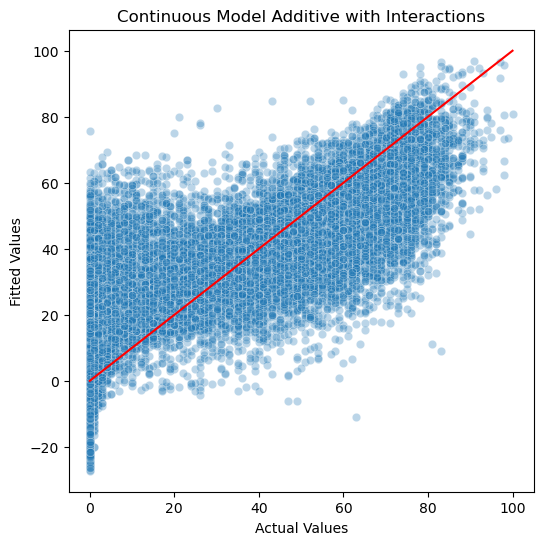

In [ ]:
viz_fitted_vs_actual(m_5.fittedvalues, spotify_model['track_popularity'], 'Continuous Model Additive with Interactions')

It is a bit better than the previous model. However, the main insight from this model the most significant features are artist_popularity and playlist_popularity. In addition, interaction between these two features with audio characteristics turned out to be significant as expected. Tracks by popular artists who have have higher hit rate will most likely have more popular tracks on average.

### Continuous and Categorical Interaction 

In [ ]:
f_6 = f"track_popularity ~ artist_avg_popularity*(danceability + energy  + speechiness + acousticness + instrumentalness + liveness + valence +     tempo + duration_ms+ playlist_avg_popularity) + \
        artist_avg_popularity*(artist_hit_rate + artist_n_tracks )+ artist_avg_popularity*({cat_features})+ playlist_avg_popularity*({cat_features})"

Interact the categorical inputs with the continuous inputs. This model must include the linear main effects as well (the formula interface helps with the interactions).

In [ ]:
m_6 = fit_ols(f_6, spotify_model)

                            OLS Regression Results                            
Dep. Variable:       track_popularity   R-squared:                       0.586
Model:                            OLS   Adj. R-squared:                  0.584
Method:                 Least Squares   F-statistic:                     387.4
Date:                Wed, 10 Dec 2025   Prob (F-statistic):               0.00
Time:                        03:56:17   Log-Likelihood:            -1.1749e+05
No. Observations:               28352   AIC:                         2.352e+05
Df Residuals:                   28248   BIC:                         2.360e+05
Df Model:                         103                                         
Covariance Type:            nonrobust                                         
                                                                             coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------

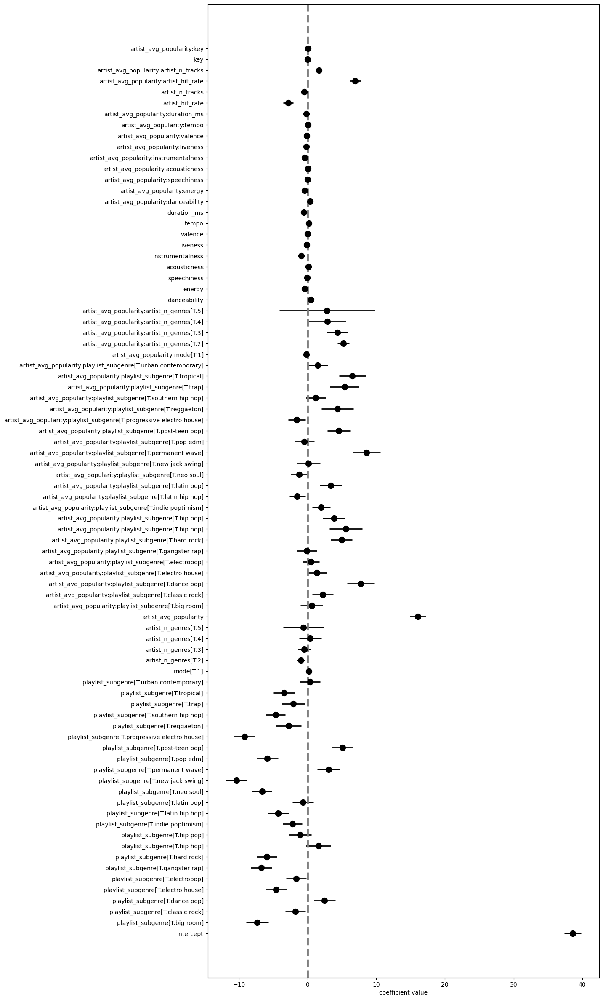

In [ ]:
my_coefplot(m_6, figsize_use=(12,30))

How many coefficients were estimated?

In [ ]:
m_6.params.size

104

How many coefficients (and thus features) are STATISTICALLY SIGNIFICANT using commonly accepted thresholds?

In [ ]:
m_6.params[m_6.pvalues < 0.05].size

60

WHICH coefficients (and thus features) are STATISTICALLY SIGNIFICANT and what are the coefficients POSITIVE or NEGATIVE for those features?

In [ ]:
m_6.params[m_6.pvalues < 0.05].sort_values(key=abs,ascending=False)

Intercept                                                                 37.480028
artist_avg_popularity                                                     14.813024
artist_avg_popularity:playlist_subgenre[T.tropical]                        6.473092
playlist_avg_popularity                                                    6.451494
artist_avg_popularity:artist_hit_rate                                      6.019263
playlist_subgenre[T.trap]                                                 -5.138187
artist_avg_popularity:playlist_subgenre[T.permanent wave]                  5.002814
artist_avg_popularity:playlist_subgenre[T.hard rock]                       4.714800
playlist_subgenre[T.reggaeton]                                            -3.960673
artist_avg_popularity:playlist_subgenre[T.big room]                        3.947721
artist_avg_popularity:playlist_subgenre[T.hip hop]                         3.688101
artist_avg_popularity:playlist_subgenre[T.dance pop]                       3

Which two STATISTICALLY SIGNIFICANT coefficients (and thus features) have the highest MAGNITUDE coefficient values?

In [ ]:
m_6.params[m_6.pvalues < 0.05].sort_values(ascending=False)[1:3]

artist_avg_popularity                                  14.813024
artist_avg_popularity:playlist_subgenre[T.tropical]     6.473092
dtype: float64

In [ ]:
print(f'R squared: {m_6.rsquared}, RMSE: {m_6.mse_resid**0.5}')

R squared: 0.5855224680078064, RMSE: 15.285476449238704


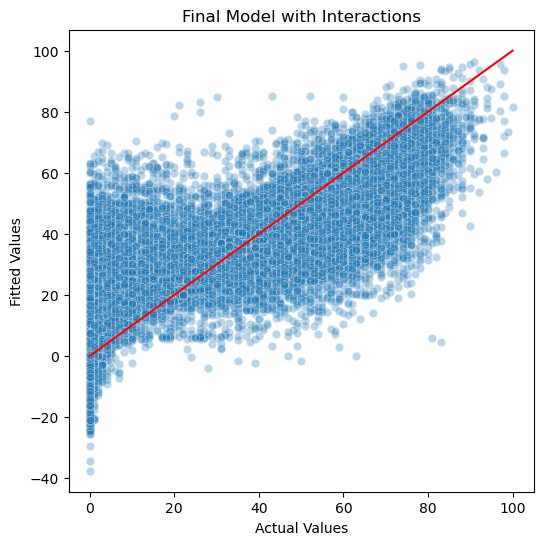

In [ ]:
viz_fitted_vs_actual(m_6.fittedvalues, spotify_model['track_popularity'], 'Final Model with Interactions')

This is the best model so far. 

The main insight that is derived is that the interaction between the genres and artist popularity along with characteristic features of a popular song such as danceability, energy, or instrumantelness are significant features of track popularity.

### Polynomials

In [ ]:
f_7 = "track_popularity ~ \
  (artist_avg_popularity + playlist_avg_popularity + danceability + energy + valence + \
   tempo + duration_ms + artist_hit_rate + artist_n_tracks)*playlist_subgenre + \
  (I(artist_avg_popularity**2) + I(playlist_avg_popularity**2) + I(danceability**2) + I(energy**2) + \
  I(valence**2) + I(tempo**2) + I(duration_ms**2) + \
  I(artist_hit_rate**2) + I(artist_n_tracks**2))*playlist_subgenre"

In [ ]:
m_7 = fit_ols(f_7, spotify_model)

                            OLS Regression Results                            
Dep. Variable:       track_popularity   R-squared:                       0.624
Model:                            OLS   Adj. R-squared:                  0.618
Method:                 Least Squares   F-statistic:                     101.7
Date:                Wed, 10 Dec 2025   Prob (F-statistic):               0.00
Time:                        03:59:10   Log-Likelihood:            -1.1611e+05
No. Observations:               28352   AIC:                         2.331e+05
Df Residuals:                   27896   BIC:                         2.369e+05
Df Model:                         455                                         
Covariance Type:            nonrobust                                         
                                                                                     coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------

How many coefficients were estimated?

In [ ]:
m_7.params.size

456

In [ ]:
m_7.params[m_7.pvalues < 0.05].size

94

In [ ]:
m_7.params[m_7.pvalues < 0.05].sort_values(key=abs,ascending=False)

Intercept                                                                         36.264634
artist_avg_popularity                                                             19.577285
playlist_avg_popularity:playlist_subgenre[T.dance pop]                           -10.052623
playlist_avg_popularity                                                            9.834377
playlist_subgenre[T.trap]                                                         -8.431859
                                                                                    ...    
I(tempo ** 2):playlist_subgenre[T.trap]                                            0.951109
I(artist_avg_popularity ** 2):playlist_subgenre[T.urban contemporary]              0.937206
I(danceability ** 2):playlist_subgenre[T.neo soul]                                -0.919639
I(playlist_avg_popularity ** 2):playlist_subgenre[T.progressive electro house]    -0.873681
I(artist_n_tracks ** 2)                                                         

In [ ]:
m_7.params[m_7.pvalues < 0.05].sort_values(ascending=False)[1:3]

artist_avg_popularity      19.577285
playlist_avg_popularity     9.834377
dtype: float64

In [ ]:
print(f'R squared: {m_7.rsquared}, RMSE: {m_7.mse_resid**0.5}')

R squared: 0.6239669509284791, RMSE: 14.650902453727106


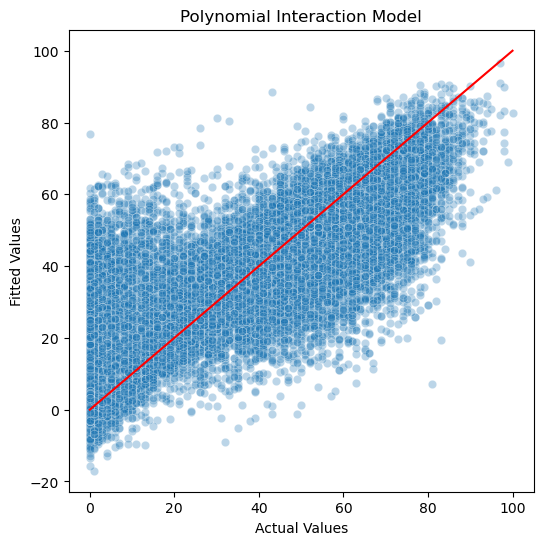

In [ ]:
viz_fitted_vs_actual(m_7.fittedvalues, spotify_model['track_popularity'], 'Polynomial Interaction Model')

There is clear improvement with Polynomial interaction model over the ones before. More points are getting closer to the redline which indciates better performance. 

### Extra interactiont terms and complexity between polynomial and categorical.

In [ ]:
f_8 = "track_popularity ~ \
  (artist_avg_popularity + playlist_avg_popularity + danceability + energy + valence + \
   tempo + duration_ms + artist_hit_rate + artist_n_tracks)*playlist_subgenre + \
  (I(artist_avg_popularity**2) + I(playlist_avg_popularity**2) + I(danceability**2) + I(energy**2) + \
  I(valence**2) + I(tempo**2) + I(duration_ms**2) + \
  I(artist_hit_rate**2) + I(artist_n_tracks**2))*playlist_subgenre + \
  (I(artist_avg_popularity**3) + I(playlist_avg_popularity**3) + I(danceability**3) + I(energy**3) + \
  I(valence**3) + I(tempo**3) + I(duration_ms**3) + \
  I(artist_hit_rate**3) + I(artist_n_tracks**3))*playlist_subgenre + \
  artist_avg_popularity*I(artist_avg_popularity**2)*playlist_subgenre + \
  artist_avg_popularity*I(artist_avg_popularity**3)*playlist_subgenre + \
  I(artist_avg_popularity**2)*I(artist_avg_popularity**3)*playlist_subgenre + \
  playlist_avg_popularity*I(playlist_avg_popularity**2)*playlist_subgenre + \
  playlist_avg_popularity*I(playlist_avg_popularity**3)*playlist_subgenre + \
  I(playlist_avg_popularity**2)*I(playlist_avg_popularity**3)*playlist_subgenre + \
  danceability*I(danceability**2)*playlist_subgenre + \
  danceability*I(danceability**3)*playlist_subgenre + \
  I(danceability**2)*I(danceability**3)*playlist_subgenre + \
  energy*I(energy**2)*playlist_subgenre + \
  energy*I(energy**3)*playlist_subgenre + \
  I(energy**2)*I(energy**3)*playlist_subgenre + \
  valence*I(valence**2)*playlist_subgenre + \
  valence*I(valence**3)*playlist_subgenre + \
  I(valence**2)*I(valence**3)*playlist_subgenre + \
  tempo*I(tempo**2)*playlist_subgenre + \
  tempo*I(tempo**3)*playlist_subgenre + \
  I(tempo**2)*I(tempo**3)*playlist_subgenre + \
  duration_ms*I(duration_ms**2)*playlist_subgenre + \
  duration_ms*I(duration_ms**3)*playlist_subgenre + \
  I(duration_ms**2)*I(duration_ms**3)*playlist_subgenre + \
  artist_hit_rate*I(artist_hit_rate**2)*playlist_subgenre + \
  artist_hit_rate*I(artist_hit_rate**3)*playlist_subgenre + \
  I(artist_hit_rate**2)*I(artist_hit_rate**3)*playlist_subgenre + \
  artist_n_tracks*I(artist_n_tracks**2)*playlist_subgenre + \
  artist_n_tracks*I(artist_n_tracks**3)*playlist_subgenre + \
  I(artist_n_tracks**2)*I(artist_n_tracks**3)*playlist_subgenre"

In [ ]:
m_8 = fit_ols(f_8, spotify_model)

                            OLS Regression Results                            
Dep. Variable:       track_popularity   R-squared:                       0.640
Model:                            OLS   Adj. R-squared:                  0.626
Method:                 Least Squares   F-statistic:                     44.00
Date:                Wed, 10 Dec 2025   Prob (F-statistic):               0.00
Time:                        06:30:02   Log-Likelihood:            -1.1548e+05
No. Observations:               28352   AIC:                         2.332e+05
Df Residuals:                   27248   BIC:                         2.423e+05
Df Model:                        1103                                         
Covariance Type:            nonrobust                                         
                                                                                                                     coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------

In [ ]:
m_8.params.size

1320

In [ ]:
m_8.params[m_8.pvalues < 0.05].size

103

In [ ]:
m_8.params[m_8.pvalues < 0.05].sort_values(key=abs,ascending=False)

Intercept                                                              29.769541
I(playlist_avg_popularity ** 2):playlist_subgenre[T.permanent wave]   -20.893496
artist_avg_popularity                                                  19.736311
I(playlist_avg_popularity ** 2):playlist_subgenre[T.dance pop]        -15.460021
I(artist_hit_rate ** 2):playlist_subgenre[T.new jack swing]            14.905346
                                                                         ...    
I(artist_avg_popularity ** 3):I(artist_n_tracks ** 3)                   0.070034
I(playlist_avg_popularity ** 3):I(artist_n_tracks ** 3)                -0.063329
I(playlist_avg_popularity ** 3):I(artist_hit_rate ** 3)                -0.035294
I(artist_avg_popularity ** 3):I(playlist_avg_popularity ** 3)          -0.009261
I(playlist_avg_popularity ** 3):I(tempo ** 3)                           0.009132
Length: 103, dtype: float64

In [ ]:
m_8.params[m_8.pvalues < 0.05].sort_values(key=abs,ascending=False)[1:3]

I(playlist_avg_popularity ** 2):playlist_subgenre[T.permanent wave]   -20.893496
artist_avg_popularity                                                  19.736311
dtype: float64

In [ ]:
print(f'R squared: {m_8.rsquared}, RMSE: {m_8.mse_resid**0.5}')

R squared: 0.6473235894945797, RMSE: 14.271722969518153


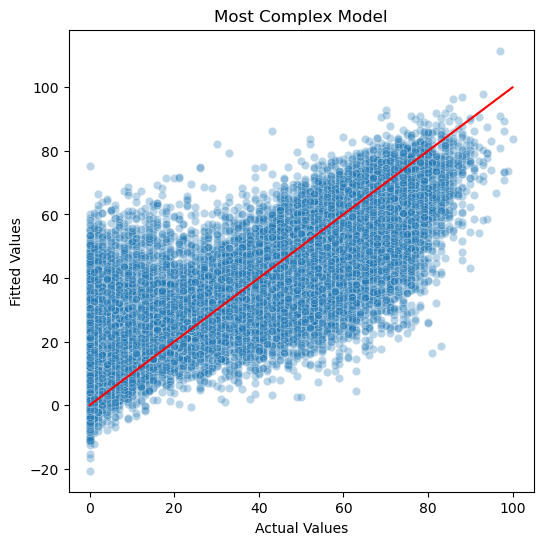

In [ ]:
viz_fitted_vs_actual(m_8.fittedvalues, spotify_model['track_popularity'], 'Most Complex Model')

Best performing model and most complex one. This might come with trade off of out of sample performance. 

## Prediction

You must predict with the model with ALL inputs and linear additive features.


This corresponds to model 4

In [ ]:
f_4

'track_popularity ~ danceability + energy  + speechiness + acousticness + instrumentalness + liveness + valence +     tempo + duration_ms + artist_avg_popularity + artist_hit_rate +     artist_n_tracks + artist_energy_mean + artist_danceability_mean + artist_valence_mean + artist_tempo_mean +     artist_acousticness_mean + artist_speechiness_mean + artist_instrumentalness_mean + artist_liveness_mean+ playlist_avg_popularity + playlist_subgenre + mode  + artist_n_genres + key'

You must identify the continuous input that you feel is the MOST important based on the statistically significant coefficients in your models. 


The most important variable in all models is artist_avg_popularity.



The MOST important input must have 101 unique values between the minimum and maximum training set values. 

In [ ]:
m_4.params[m_4.pvalues < 0.05].sort_values(key=abs,ascending=False)

Intercept                                         41.847548
artist_avg_popularity                             12.773867
playlist_subgenre[T.new jack swing]               -9.898682
playlist_subgenre[T.progressive electro house]    -8.117527
playlist_subgenre[T.big room]                     -7.707655
playlist_subgenre[T.gangster rap]                 -7.379152
playlist_subgenre[T.hard rock]                    -7.049828
playlist_subgenre[T.post-teen pop]                 5.741450
playlist_subgenre[T.pop edm]                      -5.734722
playlist_subgenre[T.neo soul]                     -5.416762
playlist_subgenre[T.electro house]                -5.350412
playlist_subgenre[T.permanent wave]                5.197357
playlist_subgenre[T.southern hip hop]             -5.132238
playlist_subgenre[T.dance pop]                     4.624844
artist_hit_rate                                    4.414877
playlist_subgenre[T.latin hip hop]                -3.553230
artist_n_genres[T.5]                    

In [ ]:
viz_1 = pd.DataFrame({'artist_avg_popularity':np.linspace(np.min(spotify_model['artist_avg_popularity']), np.max(spotify_model['artist_avg_popularity']), 101)})

In [ ]:
viz_1['playlist_avg_popularity'] = np.mean(spotify_model['playlist_avg_popularity'])
viz_1['danceability'] = np.mean(spotify_model['danceability'])
viz_1['energy'] = np.mean(spotify_model['energy'])
viz_1['speechiness'] = np.mean(spotify_model['speechiness'])
viz_1['acousticness'] = np.mean(spotify_model['acousticness'])
viz_1['instrumentalness'] = np.mean(spotify_model['instrumentalness'])
viz_1['liveness'] = np.mean(spotify_model['liveness'])
viz_1['valence'] = np.mean(spotify_model['valence'])
viz_1['tempo'] = np.mean(spotify_model['tempo'])
viz_1['duration_ms'] = np.mean(spotify_model['duration_ms'])
viz_1['artist_n_tracks'] = np.mean(spotify_model['artist_n_tracks'])
viz_1['artist_hit_rate'] = np.mean(spotify_model['artist_hit_rate'])
viz_1['artist_energy_mean'] = np.mean(spotify_model['artist_energy_mean'])
viz_1['artist_danceability_mean'] = np.mean(spotify_model['artist_danceability_mean'])
viz_1['artist_valence_mean'] = np.mean(spotify_model['artist_valence_mean'])
viz_1['artist_tempo_mean'] = np.mean(spotify_model['artist_tempo_mean'])
viz_1['artist_acousticness_mean'] = np.mean(spotify_model['artist_acousticness_mean'])
viz_1['artist_speechiness_mean'] = np.mean(spotify_model['artist_speechiness_mean'])
viz_1['artist_instrumentalness_mean'] = np.mean(spotify_model['artist_instrumentalness_mean'])
viz_1['artist_liveness_mean'] = np.mean(spotify_model['artist_liveness_mean'])


In [ ]:
viz_1['playlist_subgenre'] = spotify_model['playlist_subgenre'].mode()[0]
viz_1['mode'] = spotify_model['mode'].mode()[0]
viz_1['artist_n_genres'] = spotify_model['artist_n_genres'].mode()[0]
viz_1['key'] = spotify_model['key'].mode()[0]

In [ ]:
viz_1.nunique()

artist_avg_popularity           101
playlist_avg_popularity           1
danceability                      1
energy                            1
speechiness                       1
acousticness                      1
instrumentalness                  1
liveness                          1
valence                           1
tempo                             1
duration_ms                       1
artist_n_tracks                   1
artist_hit_rate                   1
artist_energy_mean                1
artist_danceability_mean          1
artist_valence_mean               1
artist_tempo_mean                 1
artist_acousticness_mean          1
artist_speechiness_mean           1
artist_instrumentalness_mean      1
artist_liveness_mean              1
playlist_subgenre                 1
mode                              1
artist_n_genres                   1
key                               1
dtype: int64

In [ ]:
m_4_pred_summary = m_4.get_prediction(viz_1).summary_frame()
m_4_pred_summary

,mean,mean_se,mean_ci_lower,mean_ci_upper,obs_ci_lower,obs_ci_upper
0,-4.320376,0.668659,-5.630980,-3.009771,-36.103661,27.462910
1,-3.769062,0.664081,-5.070692,-2.467432,-35.551979,28.013855
2,-3.217748,0.659532,-4.510463,-1.925033,-35.000301,28.564805
3,-2.666434,0.655014,-3.950293,-1.382576,-34.448628,29.115759
4,-2.115121,0.650527,-3.390184,-0.840057,-33.896960,29.666719
...,...,...,...,...,...,...
96,48.605744,0.481134,47.662699,49.548789,16.835492,80.375996
97,49.157058,0.482888,48.210574,50.103541,17.386704,80.927412
98,49.708372,0.484719,48.758298,50.658445,17.937911,81.478833
99,50.259685,0.486628,49.305872,51.213499,18.489112,82.030258


In [ ]:
m_8_pred_summary = m_8.get_prediction(viz_1).summary_frame()
m_8_pred_summary

,mean,mean_se,mean_ci_lower,mean_ci_upper,obs_ci_lower,obs_ci_upper
0,6.900155,3.296670,0.438514,13.361797,-22.237119,36.037430
1,7.045006,3.177685,0.816580,13.273432,-22.041438,36.131450
2,7.159484,3.295956,0.699243,13.619725,-21.977480,36.296448
3,7.247127,3.545053,0.298642,14.195611,-22.001965,36.496219
4,7.311287,3.841407,-0.218068,14.840641,-22.081215,36.703788
...,...,...,...,...,...,...
96,77.682430,4.547320,68.769451,86.595409,47.905440,107.459420
97,81.197296,5.314329,70.780940,91.613652,50.936291,111.458301
98,84.892864,6.209965,72.721015,97.064713,53.983612,115.802116
99,88.777785,7.241089,74.584880,102.970690,57.018274,120.537295


In [ ]:
fig, ax = plt.subplots()

ax.fill_between(dfA_viz_b.x2, 
               fit_A_pred_summary_b.obs_ci_lower, fit_A_pred_summary_b.obs_ci_upper,
               facecolor='orange', alpha=0.75, edgecolor='orange')
ax.fill_between(dfA_viz_b.x2,
               fit_A_pred_summary_b.mean_ci_lower, fit_A_pred_summary_b.mean_ci_upper,
               facecolor='grey',edgecolor='grey')

ax.plot(dfA_viz_b.x2, fit_A_pred_summary_b['mean'], color='k',linewidth=1)

ax.set_xlabel('x2')
ax.set_ylabel('y')

plt.show()

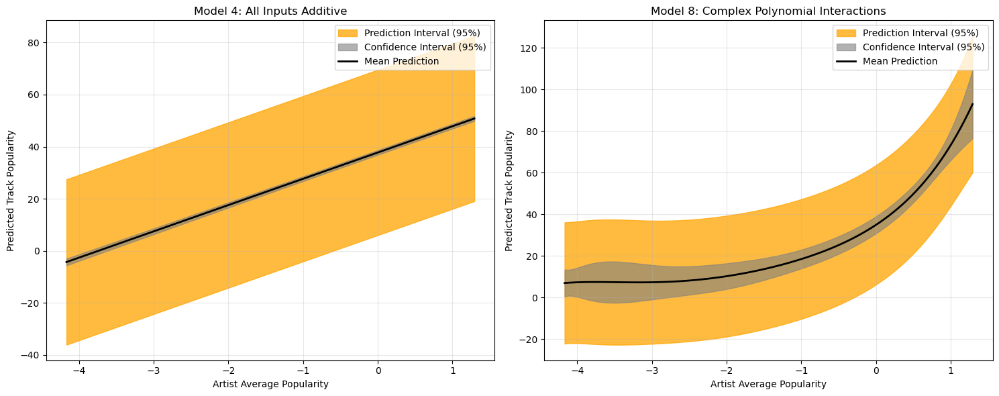

In [ ]:
# Create visualization for both models
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Model 4 (All inputs additive) - Left plot
ax1 = axes[0]

ax1.fill_between(viz_1['artist_avg_popularity'], 
               m_4_pred_summary['obs_ci_lower'], m_4_pred_summary['obs_ci_upper'],
               facecolor='orange', alpha=0.75, edgecolor='orange', label='Prediction Interval (95%)')
ax1.fill_between(viz_1['artist_avg_popularity'],
               m_4_pred_summary['mean_ci_lower'], m_4_pred_summary['mean_ci_upper'],
               facecolor='grey', edgecolor='grey', alpha=0.6, label='Confidence Interval (95%)')

ax1.plot(viz_1['artist_avg_popularity'], m_4_pred_summary['mean'], color='k', linewidth=2, label='Mean Prediction')

ax1.set_xlabel('Artist Average Popularity')
ax1.set_ylabel('Predicted Track Popularity')
ax1.set_title('Model 4: All Inputs Additive')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Model 6 (Artist-Category Interactions) - Right plot
ax2 = axes[1]

ax2.fill_between(viz_1['artist_avg_popularity'], 
               m_8_pred_summary['obs_ci_lower'], m_8_pred_summary['obs_ci_upper'],
               facecolor='orange', alpha=0.75, edgecolor='orange', label='Prediction Interval (95%)')
ax2.fill_between(viz_1['artist_avg_popularity'],
               m_8_pred_summary['mean_ci_lower'], m_8_pred_summary['mean_ci_upper'],
               facecolor='grey', edgecolor='grey', alpha=0.6, label='Confidence Interval (95%)')

ax2.plot(viz_1['artist_avg_popularity'], m_8_pred_summary['mean'], color='k', linewidth=2, label='Mean Prediction')

ax2.set_xlabel('Artist Average Popularity')
ax2.set_ylabel('Predicted Track Popularity')
ax2.set_title('Model 8: Complex Polynomial Interactions')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Model 4 is essentially staight line with tighter confidence interval. In constrast, model 7 displays polynomial shape with curvature and more exapnded intervals. Significantly, model 8 does not predict negative track popularity unlike model 4. 

You must identify the THREE most important inputs based on the statistically significant coefficients in your models. One of the three must be the SAME input you selected for grid 1. This input will have 101 unique values in the grid 2, just as it did in grid 1. The two other inputs must have fewer unique values in the grid. Categorical inputs should use all unique values (categories). Continuous inputs should use 5 unique values between the training set minimum and maximum values.

In [ ]:
viz_2 = pd.DataFrame([
    (x1, x2, x3) 
    for x1 in np.linspace(np.min(spotify_model['artist_avg_popularity']), 
                         np.max(spotify_model['artist_avg_popularity']), num=101)
    for x2 in spotify_model['playlist_subgenre'].unique()
    for x3 in np.linspace(np.min(spotify_model['playlist_avg_popularity']), 
                         np.max(spotify_model['playlist_avg_popularity']), num=5)
], columns=['artist_avg_popularity', 'playlist_subgenre', 'playlist_avg_popularity'])

In [ ]:
viz_2 = pd.DataFrame([
    (x1, x2, x3) 
    for x1 in np.linspace(np.min(spotify_model['artist_avg_popularity']), 
                         np.max(spotify_model['artist_avg_popularity']), num=101)
    for x2 in np.linspace(np.min(spotify_model['artist_hit_rate']), 
                         np.max(spotify_model['artist_hit_rate']), num=5)
    for x3 in np.linspace(np.min(spotify_model['playlist_avg_popularity']), 
                         np.max(spotify_model['playlist_avg_popularity']), num=5)
], columns=['artist_avg_popularity', 'artist_hit_rate', 'playlist_avg_popularity'])

In [ ]:
viz_2['artist_hit_rate'] = np.mean(spotify_model['artist_hit_rate'])
viz_2['danceability'] = np.mean(spotify_model['danceability'])
viz_2['energy'] = np.mean(spotify_model['energy'])
viz_2['speechiness'] = np.mean(spotify_model['speechiness'])
viz_2['acousticness'] = np.mean(spotify_model['acousticness'])
viz_2['instrumentalness'] = np.mean(spotify_model['instrumentalness'])
viz_2['liveness'] = np.mean(spotify_model['liveness'])
viz_2['valence'] = np.mean(spotify_model['valence'])
viz_2['tempo'] = np.mean(spotify_model['tempo'])
viz_2['duration_ms'] = np.mean(spotify_model['duration_ms'])
viz_2['artist_n_tracks'] = np.mean(spotify_model['artist_n_tracks'])
viz_2['artist_energy_mean'] = np.mean(spotify_model['artist_energy_mean'])
viz_2['artist_danceability_mean'] = np.mean(spotify_model['artist_danceability_mean'])
viz_2['artist_valence_mean'] = np.mean(spotify_model['artist_valence_mean'])
viz_2['artist_tempo_mean'] = np.mean(spotify_model['artist_tempo_mean'])
viz_2['artist_acousticness_mean'] = np.mean(spotify_model['artist_acousticness_mean'])
viz_2['artist_speechiness_mean'] = np.mean(spotify_model['artist_speechiness_mean'])
viz_2['artist_instrumentalness_mean'] = np.mean(spotify_model['artist_instrumentalness_mean'])
viz_2['artist_liveness_mean'] = np.mean(spotify_model['artist_liveness_mean'])

In [ ]:
viz_2['mode'] = spotify_model['mode'].mode()[0]
viz_2['artist_n_genres'] = spotify_model['artist_n_genres'].mode()[0]
viz_2['key'] = spotify_model['key'].mode()[0]
viz_2['playlist_subgenre'] = spotify_model['playlist_subgenre'].mode()[0]

In [ ]:
viz_2['mode'] = spotify_model['mode'].mode()[0]
viz_2['artist_n_genres'] = spotify_model['artist_n_genres'].mode()[0]
viz_2['key'] = spotify_model['key'].mode()[0]

In [ ]:
viz_2.nunique()

artist_avg_popularity           101
playlist_subgenre                24
playlist_avg_popularity           5
artist_hit_rate                   1
danceability                      1
energy                            1
speechiness                       1
acousticness                      1
instrumentalness                  1
liveness                          1
valence                           1
tempo                             1
duration_ms                       1
artist_n_tracks                   1
artist_energy_mean                1
artist_danceability_mean          1
artist_valence_mean               1
artist_tempo_mean                 1
artist_acousticness_mean          1
artist_speechiness_mean           1
artist_instrumentalness_mean      1
artist_liveness_mean              1
mode                              1
artist_n_genres                   1
key                               1
dtype: int64

Make predictions with BOTH models on the visualization grid. You MUST visualize the AVERAGE OUTPUT as a line with respect to the input with the 101 unique values in the visualization grid. The line must be colored by one of the two other inputs with non-constant values. The third input must be associated with the facets. It is your choice as to which input is associated with the line color (hue) versus the facets.  If you color by a continuous variable, you should use a diverging color palette. You may use the default color palette for coloring by a categorical variable.

In [ ]:
m_4_pred_summary_2 = m_4.get_prediction(viz_2).summary_frame()
m_8_pred_summary_2 = m_8.get_prediction(viz_2).summary_frame()

In [ ]:
dfviz2 = pd.DataFrame({
    'artist_avg_popularity': viz_2['artist_avg_popularity'],
    'm4_pred': m_4_pred_summary_2['mean'],
    'm8_pred': m_8_pred_summary_2['mean'],
    'playlist_subgenre': viz_2['playlist_subgenre'],
    'playlist_avg_popularity': viz_2['playlist_avg_popularity']
})

d:\Anaconda\venv\cmpin2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


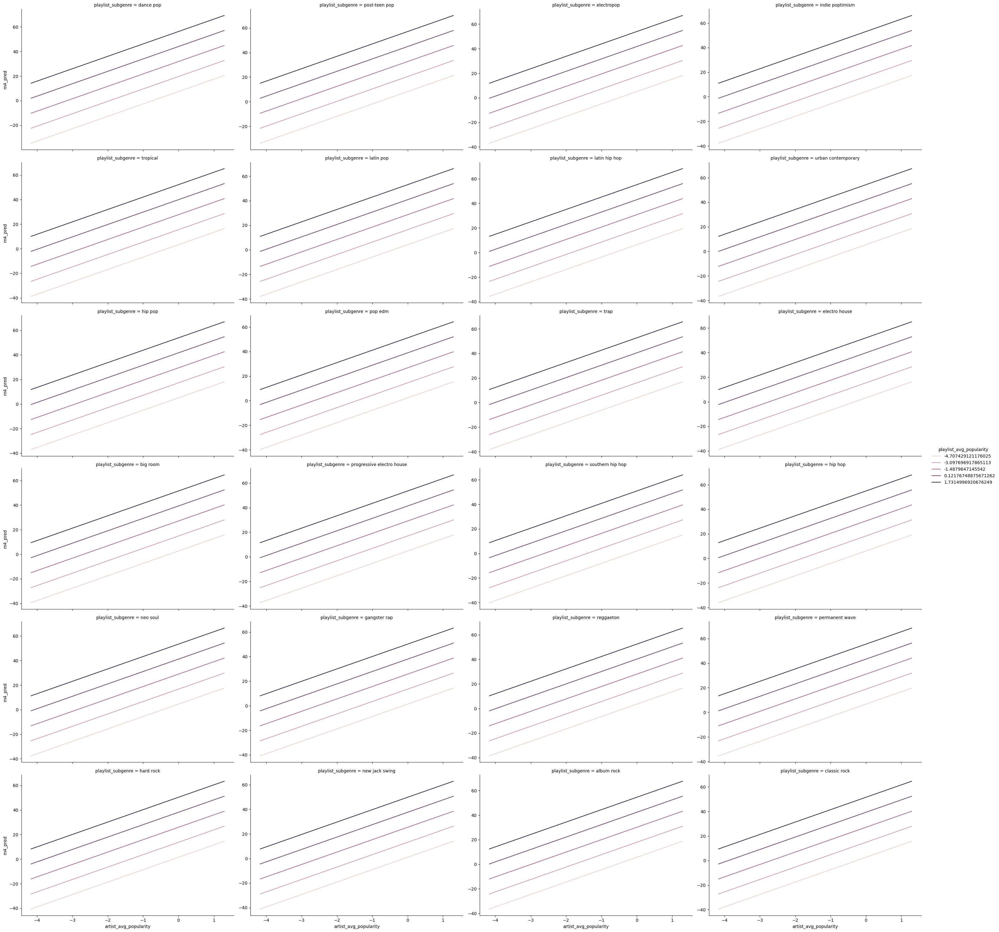

In [ ]:
sns.relplot(data=dfviz2, x='artist_avg_popularity', y='m4_pred', hue='playlist_avg_popularity', 
           kind='line', aspect=1.5, col='playlist_subgenre', col_wrap=4,
           facet_kws={'sharey': False})
plt.show()


d:\Anaconda\venv\cmpin2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


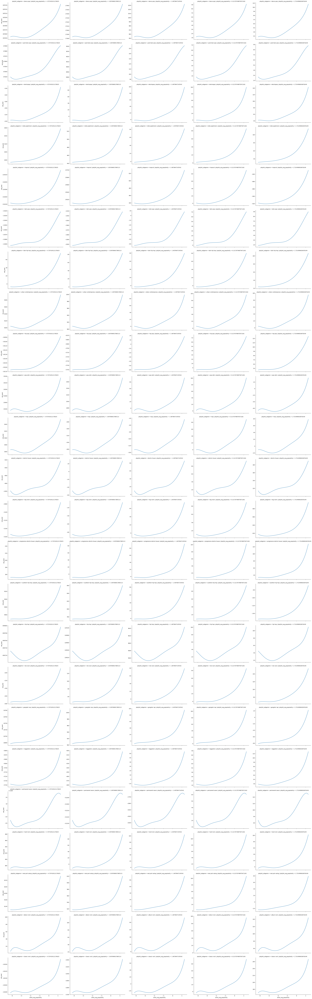

In [ ]:
sns.relplot(data=dfviz2,x='artist_avg_popularity',y='m8_pred',row='playlist_subgenre',kind='line',aspect=1.5,col='playlist_avg_popularity', facet_kws={'sharey': False})
plt.show()

The predictions by the two models indciate several things. Model 4 indicates consistent predictions for unseen data. It also shows associates

The more complex model, model 8, on the other hand, contain non linear interactions as indicated by the curved graphs. This is natural as it was constructed with many embedded interactions. However, the model predicts extremely negative values for several subgenres. This indicates potential overfit. 

This is not seen with model 4 however. We see more consistent values that are more reasonable. There are some subgenres where track popularity drops below 0 but it is consistent for the most part. This indicates that model 4 will perform better on unforseen data while model 8 already performs much worst.

### 	Models: Performance and Validation 

You must select the formulation that was the best model on the training set.

The best formulation was Polynomial Interaction model 7.

You must choose 2 additional formulations. One should be simple (few features), and one should be of medium to high complexity.

Simple model would be continuous only inputs. model 3

Medium complexity is model 5 that has interaction terms between continuous and categoricals.

You must use CROSS-VALIDATION to evaluate the performance for each of the 3 models. Using “regular” K-fold OR stratified K-fold depends on whether you are working on a REGRESSION or CLASSIFICATION problem. You may choose 5-fold, 10-fold, or repeated cross-validation. You must identify an appropriate performance metric to focus on based on the output data type.

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
from patsy import dmatrices

In [ ]:
def fit_and_assess_linearregression(mod_name, a_formula, the_data):
    # create arrays
    y, X = dmatrices(a_formula, data=the_data)
    
    a_mod = LinearRegression(fit_intercept=False).fit( X, y.ravel() )
    
    res_dict = {'model_name': mod_name,
                'model_formula': a_formula,
                'num_coefs': a_mod.coef_.size,
                'R-squared': a_mod.score(X, y.ravel())}
    
    return pd.DataFrame( res_dict, index=[0] )

In [ ]:
linearregression_results_list = []
models = [1,2,3,4,5,6,7,8]
for m in models:
    linearregression_results_list.append(
        fit_and_assess_linearregression(f'Model {m}', eval(f'f_{m}'), spotify_model)
    )

In [ ]:
linearregression_results_df = pd.concat(linearregression_results_list, ignore_index=True)

In [ ]:
linearregression_results_df

,model_name,model_formula,num_coefs,R-squared
0,Model 1,track_popularity ~ 1,1,0.000000
1,Model 2,track_popularity ~ +playlist_subgenre + mode ...,27,0.154829
2,Model 3,track_popularity ~ danceability + energy + sp...,22,0.527651
3,Model 4,track_popularity ~ danceability + energy + sp...,48,0.533418
4,Model 5,track_popularity ~ (danceability + energy + s...,92,0.581912
5,Model 6,track_popularity ~ artist_avg_popularity*(danc...,104,0.585522
6,Model 7,track_popularity ~ (artist_avg_popularity + ...,456,0.623967
7,Model 8,track_popularity ~ (I(artist_avg_popularity*...,780,0.647324


In [ ]:
from sklearn.model_selection import KFold

In [ ]:
kf = KFold(n_splits=5, shuffle=True, random_state=101)

In [ ]:
from sklearn.model_selection import cross_val_score

In [ ]:
def lm_cross_val_score(mod_name, a_formula, init_mod, the_data, cv):
    # create the feature and output arrays using the formula
    y, X = dmatrices( a_formula+"-1", data=the_data )
    
    # train and test within each fold - return the test set scores
    # rsquared
    test_r2 = cross_val_score( init_mod, X, y.ravel(), cv=cv )
    # rmse
    test_rmse = -cross_val_score( init_mod, X, y.ravel(), cv=cv, scoring='neg_root_mean_squared_error' )
    
    # book keeping
    res_df=pd.DataFrame({'R-squared': test_r2,
                         'RMSE': test_rmse})
    
    res_df['fold_id'] = res_df.index + 1
    res_df['model_name'] = mod_name
    res_df['model_formula'] = a_formula
    res_df['num_coefs'] = X.shape[1]
    
    return res_df

We retrieve the data before there was any standardization

In [ ]:
spotify_model = spotify.copy()
spotify_model = spotify_model.merge(artist_vars, on='track_artist', how='inner')
spotify_model = spotify_model.merge(playlist_vars, on='playlist_id', how='inner')
cont_var = ['danceability', 'energy','speechiness',
    'acousticness', 'instrumentalness', 'liveness', 'valence',
    'tempo', 'duration_ms', 'artist_avg_popularity',
 'artist_n_tracks',
 'artist_hit_rate',
 'artist_energy_mean',
 'artist_danceability_mean',
 'artist_valence_mean',
 'artist_tempo_mean',
 'artist_acousticness_mean',
 'artist_speechiness_mean',
 'artist_instrumentalness_mean',
 'artist_liveness_mean','playlist_avg_popularity']
cat_var = ['playlist_subgenre', 'mode','artist_n_genres', 'key']
spotify_model[cat_var] = spotify_model[cat_var].astype('category')
spotify_model[cont_var] = np.log1p(spotify_model[cont_var])

In [ ]:
from sklearn.pipeline import Pipeline

In [ ]:
lm = LinearRegression()

In [ ]:
# Define the pipeline correctly
lm = LinearRegression()
model_flow = Pipeline([('standardize', StandardScaler()), ('fit', lm)])

# Test it with actual data
y, X = dmatrices(f_4+"-1", data=spotify_model)  # Use an actual formula
z = model_flow.fit(X, y.ravel())
print(f"Pipeline R-squared: {z.score(X, y.ravel())}")

Pipeline R-squared: 0.5339279812076785


In [ ]:
model_flow = Pipeline( steps=[ ('standardize', StandardScaler()),('fit', lm) ] )

In [ ]:
cv_score_list = []
models = [1,2,3,4,5,6,7,8]
for m in models:
    cv_score_list.append(
        lm_cross_val_score(f'Model {m}', eval(f'f_{m}'), model_flow, spotify_model, kf)
    )

In [ ]:
cv_score_df = pd.concat(cv_score_list, ignore_index=True)

C:\Users\pc\AppData\Local\Temp\ipykernel_15864\2824232948.py:1: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.catplot(data = cv_score_df, x='model_name', y='R-squared', kind='point', aspect=1.5, join=False,errorbar=('ci',95))
d:\Anaconda\venv\cmpin2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


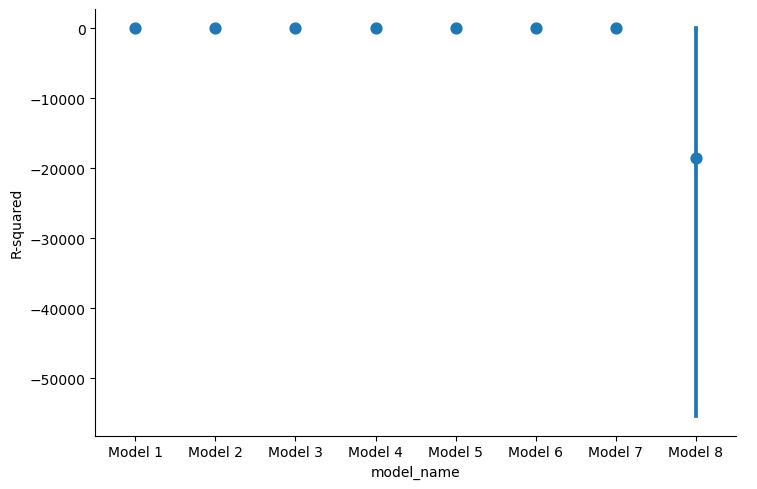

In [ ]:
sns.catplot(data = cv_score_df, x='model_name', y='R-squared', kind='point', aspect=1.5, join=False,errorbar=('ci',95))
plt.show()

C:\Users\pc\AppData\Local\Temp\ipykernel_15864\632921638.py:1: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.catplot(data = cv_score_df, x='model_name', y='RMSE', kind='point', aspect=1.5, join=False,errorbar=('ci',95))
d:\Anaconda\venv\cmpin2100\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


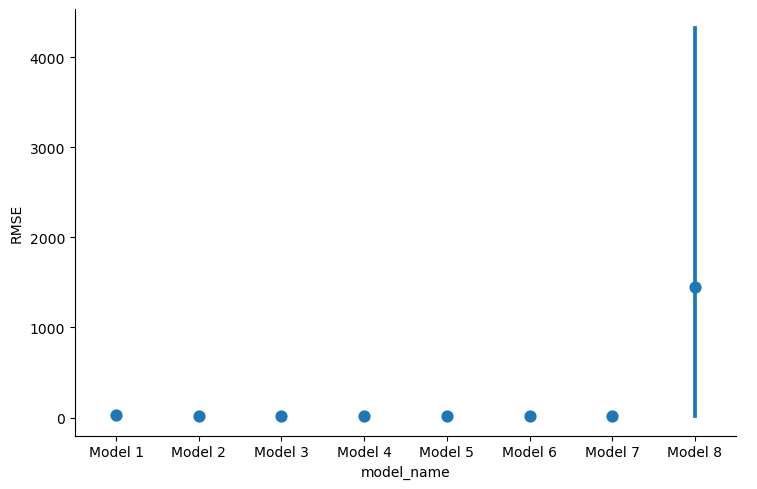

In [ ]:
sns.catplot(data = cv_score_df, x='model_name', y='RMSE', kind='point', aspect=1.5, join=False,errorbar=('ci',95))
plt.show()

Which model is the BEST according to CROSS-VALIDATION?

In [ ]:
cv_score_df

,R-squared,RMSE,fold_id,model_name,model_formula,num_coefs
0,-0.000662,23.637349,1,Model 1,track_popularity ~ 1,1
1,-0.000082,23.359256,2,Model 1,track_popularity ~ 1,1
2,-0.000968,24.082243,3,Model 1,track_popularity ~ 1,1
3,-0.000061,23.640301,4,Model 1,track_popularity ~ 1,1
4,-0.000023,23.777993,5,Model 1,track_popularity ~ 1,1
5,0.152738,21.750227,1,Model 2,track_popularity ~ +playlist_subgenre + mode ...,40
6,0.159812,21.410636,2,Model 2,track_popularity ~ +playlist_subgenre + mode ...,40
7,0.151861,22.167685,3,Model 2,track_popularity ~ +playlist_subgenre + mode ...,40
8,0.158546,21.684781,4,Model 2,track_popularity ~ +playlist_subgenre + mode ...,40
9,0.157595,21.823817,5,Model 2,track_popularity ~ +playlist_subgenre + mode ...,40


In [ ]:
print(cv_score_df.groupby('model_name')['RMSE'].mean().reset_index().sort_values('RMSE').iloc[0])

model_name      Model 7
RMSE          14.836801
Name: 6, dtype: object


Model 7 has the lowest RMSE and therefore highest R squared. Therefore, it is the best model.

Is this model DIFFERENT from the model identified as the BEST according to the training set?


Yes. Training perforamnce indicated model 7 to be the best. 

In [ ]:
linearregression_results_df.groupby('model_name')['R-squared'].max().reset_index().sort_values('R-squared', ascending=False).iloc[0].values == cv_score_df.groupby('model_name')['R-squared'].mean().reset_index().sort_values('R-squared').iloc[0]

model_name     True
R-squared     False
Name: 7, dtype: bool

No it was not. Training performance favored the most complex model. In cross validation, the most complext model performed the worst than intercept only model.

How many regression coefficients are associated with the best model?

In [ ]:
cv_score_df.groupby(['model_name','num_coefs'])['RMSE'].mean().reset_index().sort_values('RMSE').iloc[0]

model_name      Model 7
num_coefs           456
RMSE          14.836801
Name: 6, dtype: object

There were 456 coefficients. 